This file contains code for 

- compare graph metrics among TVDN, TVDMD, ND, DMD

- graph metric plotting for TVDN

- graph metric plotting for ND

In [1]:
import sys
sys.path.append("/home/huaqingj/MyResearch/TVDN-AD")

In [2]:
from pyTVDN import TVDNDetect
from pathlib import Path
from scipy.io import loadmat
import numpy as np
from easydict import EasyDict as edict
import matplotlib.pyplot as plt
import os
import scipy.stats as ss
from scipy import signal
from tqdm import tqdm, trange
import pickle
import seaborn as sns
import numbers
import scipy
import pandas as pd
%matplotlib inline

In [3]:
os.chdir("/home/huaqingj/MyResearch/TVDN-AD/")
resDir = Path("./results")
dataDir = Path("./data")

## Some fns

In [4]:
def load_pkl(fil):
    with open(fil, "rb") as f:
        result = pickle.load(f)
    return result

In [5]:
# calculat the topk mean of graphic feature based on dwell time
def topk_mean(topk, graphic_f, dwell, key):
    idxs = np.argsort(-dwell)[:topk]
    sel_graphic_f = np.array([graphic_f[idx][key] for idx in idxs])
    sel_dwell = dwell[idxs]
    mean_v = np.mean(sel_graphic_f)
    ws = sel_dwell/np.sum(sel_dwell)
    return mean_v

In [6]:
def CI95(cur_fs):
    mean_v, se_v = np.mean(cur_fs), np.std(cur_fs)/np.sqrt(len(cur_fs))
    low, up = mean_v - 1.96*se_v, mean_v + 1.96*se_v
    return [low, up]

## Load results

In [7]:
def tmp_extrac1(data, key="tmC"):
    name_map = ["tmC", "tmL", "tQ"]
    idx = name_map.index(key)
    vs = []
    for dat in data:
        vs.append(dat["ms"][idx])

    return vs


In [8]:
# From TV
TV_graphic_fs_AD = load_pkl(resDir/"AD_data_NWM_TV.pkl")
TV_graphic_fs_Ctrl = load_pkl(resDir/"Ctrl_data_NWM_TV.pkl")

In [9]:
# From DMD
DMD_graphic_fs_AD = load_pkl(resDir/"AD_data_NWM_DMD.pkl")
DMD_graphic_fs_Ctrl = load_pkl(resDir/"Ctrl_data_NWM_DMD.pkl")

In [10]:
# from TVDN
graphic_fs_AD = load_pkl(resDir/"graphic_fs_AD.pkl")
graphic_fs_Ctrl = load_pkl(resDir/"graphic_fs_Ctrl.pkl")

In [11]:
with open("./OtherFils/KpIdxsAll.pkl", "rb") as sf:
    kpAD, kpCtrl, kpAll = pickle.load(sf)

In [12]:
# dwell
fil = list(resDir.glob("AD_*_ecpts.pkl"))[0]
with open(fil, "rb") as f:
    ecptssAD = pickle.load(f)
fil = list(resDir.glob("Ctrl_*_ecpts.pkl"))[0]
with open(fil, "rb") as f:
    ecptssCtrl = pickle.load(f)
    
# Sel data (only need when use sub data)
ecptssAD = [ ecptsAD for ecptsAD, kpix in zip(ecptssAD, kpAD) if kpix==1]
ecptssCtrl = [ ecptsCtrl for ecptsCtrl, kpix in zip(ecptssCtrl, kpCtrl) if kpix==1]

# Dwell times in second
freq = 120
dwellsAD = [np.diff(np.concatenate([[0], ecpts, [7200]])/freq) for ecpts in ecptssAD]
dwellsCtrl = [np.diff(np.concatenate([[0], ecpts, [7200]])/freq) for ecpts in ecptssCtrl]

In [13]:
cols = ["dodgerblue", "coral"]
fs_name = ["Modularity", "Weighted path length", "Clustering coefficient"]
fs_name_raw = ["tQ", "tmL", "tmC"]

## Analysis

tQ 2.7477619833551703 2.725742529695233
tmL 0.9940416844442846 1.0146352197894686
tmC 1.0418582615872103 1.0503503326339567


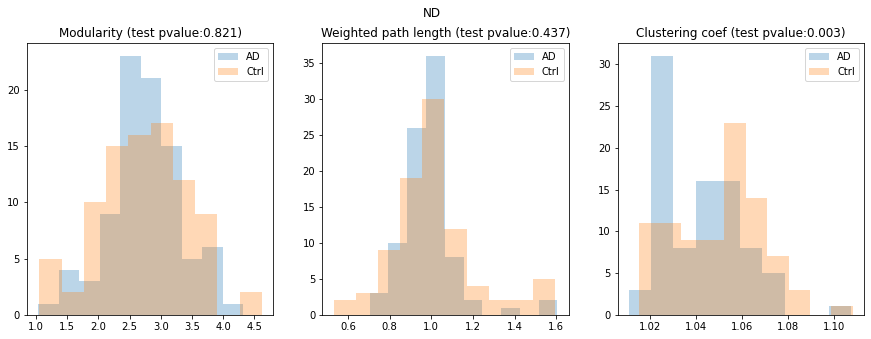

In [42]:
#TV
plt.figure(figsize=[15, 5])
plt.suptitle("ND")
for ix, cur_f in enumerate(["tQ", "tmL", "tmC"]):
    cur_fs_AD = tmp_extrac1(TV_graphic_fs_AD, cur_f)
    cur_fs_Ctrl = tmp_extrac1(TV_graphic_fs_Ctrl, cur_f)
    #test_res = scipy.stats.ranksums(cur_fs_AD, cur_fs_Ctrl)
    test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)
    print(cur_f, np.mean(cur_fs_AD), np.mean(cur_fs_Ctrl))

    plt.subplot(1, 3, ix+1)
    plt.title(f"{fs_name[ix]} (test pvalue:{test_res.pvalue:.3f})")
    plt.hist(cur_fs_AD, label="AD", alpha=0.3)
    plt.hist(cur_fs_Ctrl, label="Ctrl", alpha=0.3)
    plt.legend()

tQ 1.9744472968805318 2.150451633045083
tmL 0.9924499786697855 0.9969158047750444
tmC 1.008373408276916 1.0110120097374122


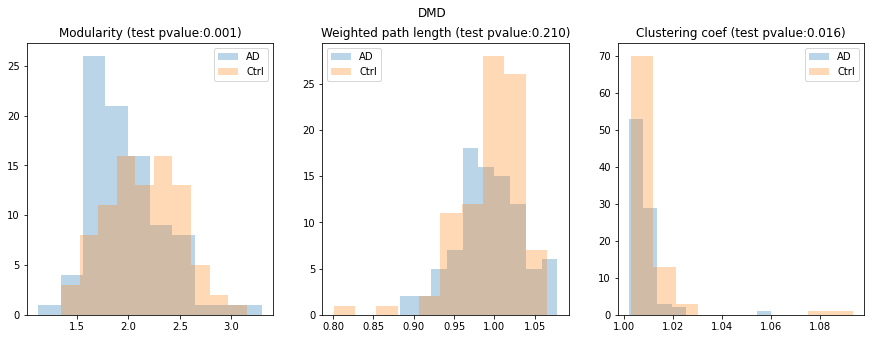

In [75]:
#DMD
plt.figure(figsize=[15, 5])
plt.suptitle("DMD")
for ix, cur_f in enumerate(["tQ", "tmL", "tmC"]):
    cur_fs_AD = tmp_extrac1(DMD_graphic_fs_AD, cur_f)
    cur_fs_Ctrl = tmp_extrac1(DMD_graphic_fs_Ctrl, cur_f)
    test_res = scipy.stats.ranksums(cur_fs_AD, cur_fs_Ctrl)
    #test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)
    print(cur_f, np.mean(cur_fs_AD), np.mean(cur_fs_Ctrl))

    plt.subplot(1, 3, ix+1)
    plt.title(f"{fs_name[ix]} (test pvalue:{test_res.pvalue:.3f})")
    plt.hist(cur_fs_AD, label="AD", alpha=0.3)
    plt.hist(cur_fs_Ctrl, label="Ctrl", alpha=0.3)
    plt.legend()

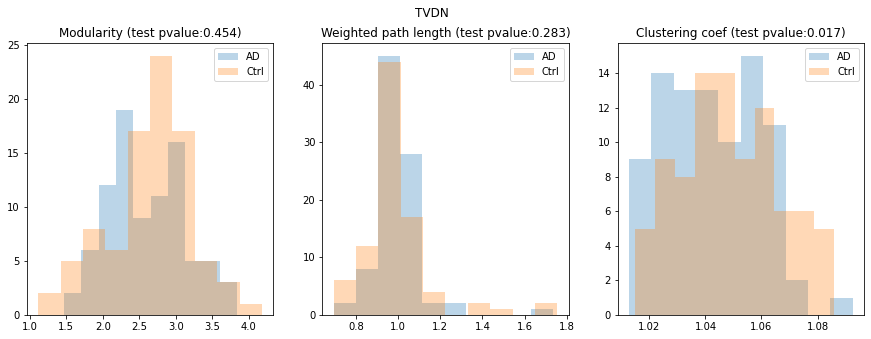

In [74]:
# TVDN
plt.figure(figsize=[15, 5])
plt.suptitle("TVDN")
for ix, cur_f in enumerate(["tQ", "tmL", "tmC"]):
    cur_fs_AD = [topk_mean(1, graphic_f, dwell, cur_f)
                 for graphic_f, dwell in zip(graphic_fs_AD, dwellsAD)]
    cur_fs_Ctrl = [topk_mean(1, graphic_f, dwell, cur_f)
                   for graphic_f, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)]
    #test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)
    test_res = scipy.stats.ranksums(cur_fs_AD, cur_fs_Ctrl)

    plt.subplot(1, 3, ix+1)
    plt.title(f"{fs_name[ix]} (test pvalue:{test_res.pvalue:.3f})")
    plt.hist(cur_fs_AD, label="AD", alpha=0.3)
    plt.hist(cur_fs_Ctrl, label="Ctrl", alpha=0.3)
    plt.legend()

tQ 2.5939047641985384 2.7194336059775552 0.0036062701054640246
tmL 0.989142917155186 1.0095349341670479 0.07249829518930012
tmC 1.0400442862409387 1.0468534132472145 1.9163049476815846e-06


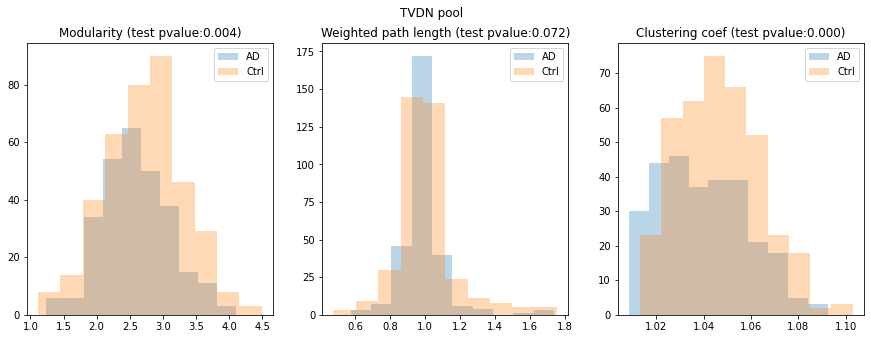

In [41]:
plt.figure(figsize=[15, 5])
plt.suptitle("TVDN pool")
for ix, cur_f in enumerate(["tQ", "tmL", "tmC"]):
    cur_fs_AD =  np.concatenate([[iy[cur_f] for iy in ix ] 
                                 for ix in graphic_fs_AD])
    cur_fs_Ctrl =  np.concatenate([[iy[cur_f] for iy in ix ] 
                                 for ix in graphic_fs_Ctrl])
    test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)
    #test_res = scipy.stats.ranksums(cur_fs_AD, cur_fs_Ctrl)
    print(cur_f, np.mean(cur_fs_AD), np.mean(cur_fs_Ctrl), test_res.pvalue)

    plt.subplot(1, 3, ix+1)
    plt.title(f"{fs_name[ix]} (test pvalue:{test_res.pvalue:.3f})")
    plt.hist(cur_fs_AD, label="AD", alpha=0.3)
    plt.hist(cur_fs_Ctrl, label="Ctrl", alpha=0.3)
    plt.legend()

tQ 2.583222996351429 2.7411774272841036 0.0017828565831396648
tmL 0.9870666546850998 1.0137958574980173 0.10065468436518427
tmC 1.0392186598730473 1.046308642901252 1.7891534405028176e-05


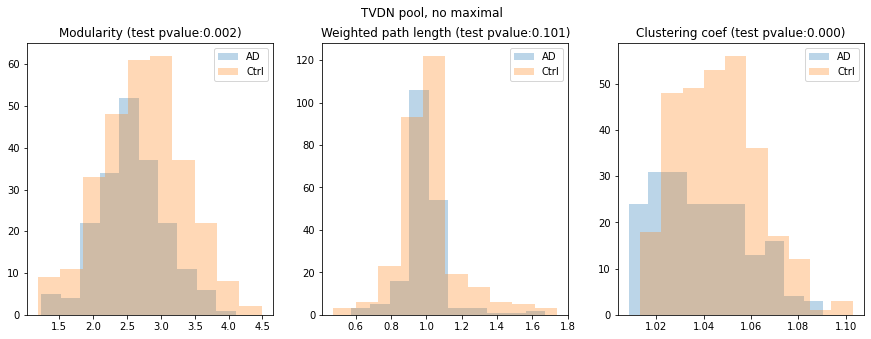

In [72]:
def tmp_extract_nonmax(graphic, dwell):
    if len(dwell) == 1:
        return []
    else:
        return [graphic[ix][cur_f] for ix in np.argsort(dwell)[:-1]]
    
plt.figure(figsize=[15, 5])
plt.suptitle("TVDN pool, no maximal")
for ix, cur_f in enumerate(["tQ", "tmL", "tmC"]):
    cur_fs_AD =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_AD, dwellsAD)])
    cur_fs_Ctrl =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)])
    test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)
    test_res = scipy.stats.ranksums(cur_fs_AD, cur_fs_Ctrl)
    print(cur_f, np.mean(cur_fs_AD), np.mean(cur_fs_Ctrl), test_res.pvalue)

    plt.subplot(1, 3, ix+1)
    plt.title(f"{fs_name[ix]} (test pvalue:{test_res.pvalue:.3f})")
    plt.hist(cur_fs_AD, label="AD", alpha=0.3)
    plt.hist(cur_fs_Ctrl, label="Ctrl", alpha=0.3)
    plt.legend()

tQ 0.23014872790948254 0.33526875436973075 0.002710601019416486
tmL 0.040549774479448054 0.08117248879563005 0.00010049496852079261
tmC 0.007870488419730369 0.009658254965888902 0.07757260711170391


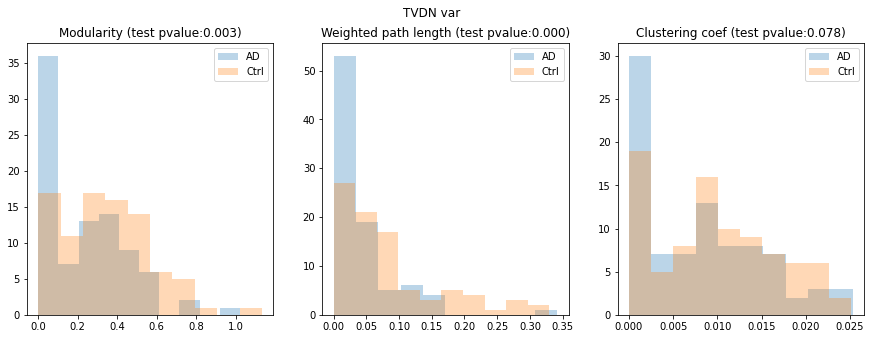

In [78]:
plt.figure(figsize=[15, 5])
plt.suptitle("TVDN var")
for ix, cur_f in enumerate(["tQ", "tmL", "tmC"]):
    cur_fs_AD =  np.array([np.std([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
    cur_fs_Ctrl =  np.array([np.std([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
    #test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)
    test_res = scipy.stats.ranksums(cur_fs_AD, cur_fs_Ctrl)
    print(cur_f, np.mean(cur_fs_AD), np.mean(cur_fs_Ctrl), test_res.pvalue)

    plt.subplot(1, 3, ix+1)
    plt.title(f"{fs_name[ix]} (test pvalue:{test_res.pvalue:.3f})")
    plt.hist(cur_fs_AD, label="AD", alpha=0.3)
    plt.hist(cur_fs_Ctrl, label="Ctrl", alpha=0.3)
    plt.legend()

## Output figs (box)

In [431]:
def tmp_plot_base(cur_fs_AD, cur_fs_Ctrl):
    box = plt.boxplot(cur_fs_AD, positions=[0.4],
                      notch=True, showfliers=False,  patch_artist=True);
    for item in ['boxes', 'whiskers',  'medians', 'caps']:
    # set colors for all elements in boxplot
        plt.setp(box[item], color=cols[0])
    box1 = box
    
    box = plt.boxplot(cur_fs_Ctrl, positions=[0.6],
                      notch=True, showfliers=False,  patch_artist=True);
    for item in ['boxes', 'whiskers',  'medians', 'caps']:
        plt.setp(box[item], color=cols[1])
    box2 = box
    
    plt.xlim([0.3, 0.7])
    plt.xticks([0.4, 0.6], ["AD", "Control"])
    
def tmp_plot_bar(txty, bary, fs, pvalue, is_small=False):
    AD_fs, Ctrl_fs = fs

    txtxdlt = 0.1
    # left txt
    ix = 0.4
    if is_small:
        txt1 = f"Mean: {np.mean(AD_fs):.2e} \n IQR [{np.quantile(AD_fs, 0.25):.2e}, {np.quantile(AD_fs, 0.75):.2e}]"
    else:
        txt1 = f"Mean: {np.mean(AD_fs):.3f} \n IQR [{np.quantile(AD_fs, 0.25):.3f}, {np.quantile(AD_fs, 0.75):.3f}]"
    plt.text(ix, txty, txt1, ha='center', va='bottom', color="k")
    
    # right txt
    ix = 0.6
    if is_small:
        txt2 = f"Mean: {np.mean(Ctrl_fs):.2e} \n IQR [{np.quantile(Ctrl_fs, 0.25):.2e}, {np.quantile(Ctrl_fs, 0.75):.2e}]"
    else:
        txt2 = f"Mean: {np.mean(Ctrl_fs):.3f} \n IQR [{np.quantile(Ctrl_fs, 0.25):.3f}, {np.quantile(Ctrl_fs, 0.75):.3f}]"
    plt.text(ix, txty, txt2, ha='center', va='bottom', color="k")
    
    # bar and txt above
    ix = 0.5
    txtxdlt = 0.1
    txtx1, txtx2 = ix-txtxdlt, ix+txtxdlt
    #txth = 0.3
    
    all_dat = np.concatenate([AD_fs, Ctrl_fs])
    txth = (np.quantile(all_dat, 0.75) - np.quantile(all_dat, 0.25))/5
    txth1 = (np.quantile(all_dat, 0.75) - np.quantile(all_dat, 0.25))/10
    plt.plot([txtx1, txtx1, txtx2, txtx2], [bary, bary+txth, bary+txth, bary], lw=1.5, c="k")
    txt1 = f"P-value: {pvalue:.3f}"
    if pvalue < 0.001:
        txt1 = f"P-value < 0.001"
    else: 
        txt1 = f"P-value: {pvalue:.3f}"
    plt.text(ix, bary+txth+txth1, txt1, ha='center', va='bottom', color="k")

### Plots of top1

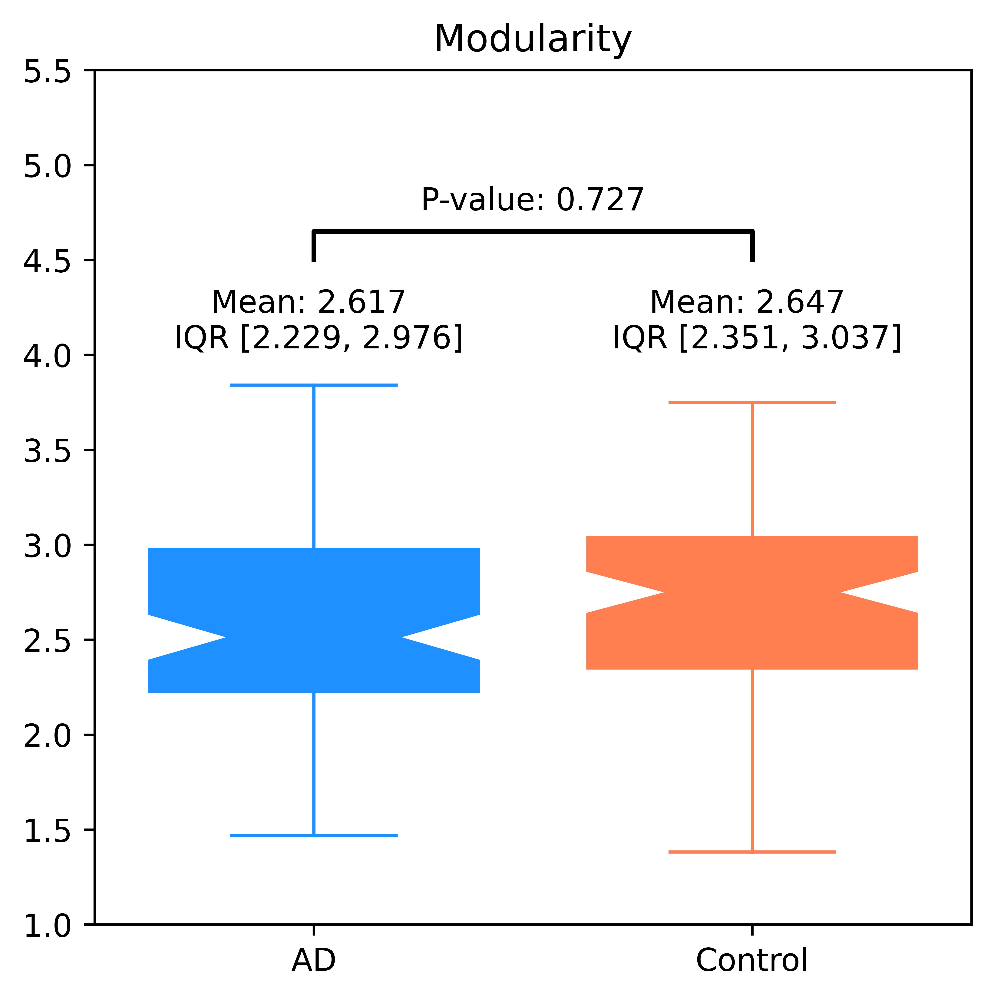

In [432]:
cur_f = "tQ"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD = [topk_mean(1, graphic_f, dwell, cur_f)
                 for graphic_f, dwell in zip(graphic_fs_AD, dwellsAD)]
cur_fs_Ctrl = [topk_mean(1, graphic_f, dwell, cur_f)
                   for graphic_f, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)]
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_plot_base(cur_fs_AD, cur_fs_Ctrl)
tmp_plot_bar(txty=4, bary=4.5, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
plt.ylim([1, 5.5])
plt.title(full_name)

plt.savefig(f"./plots/graphic_fs_top1_{full_name}.jpg", bbox_inches='tight')

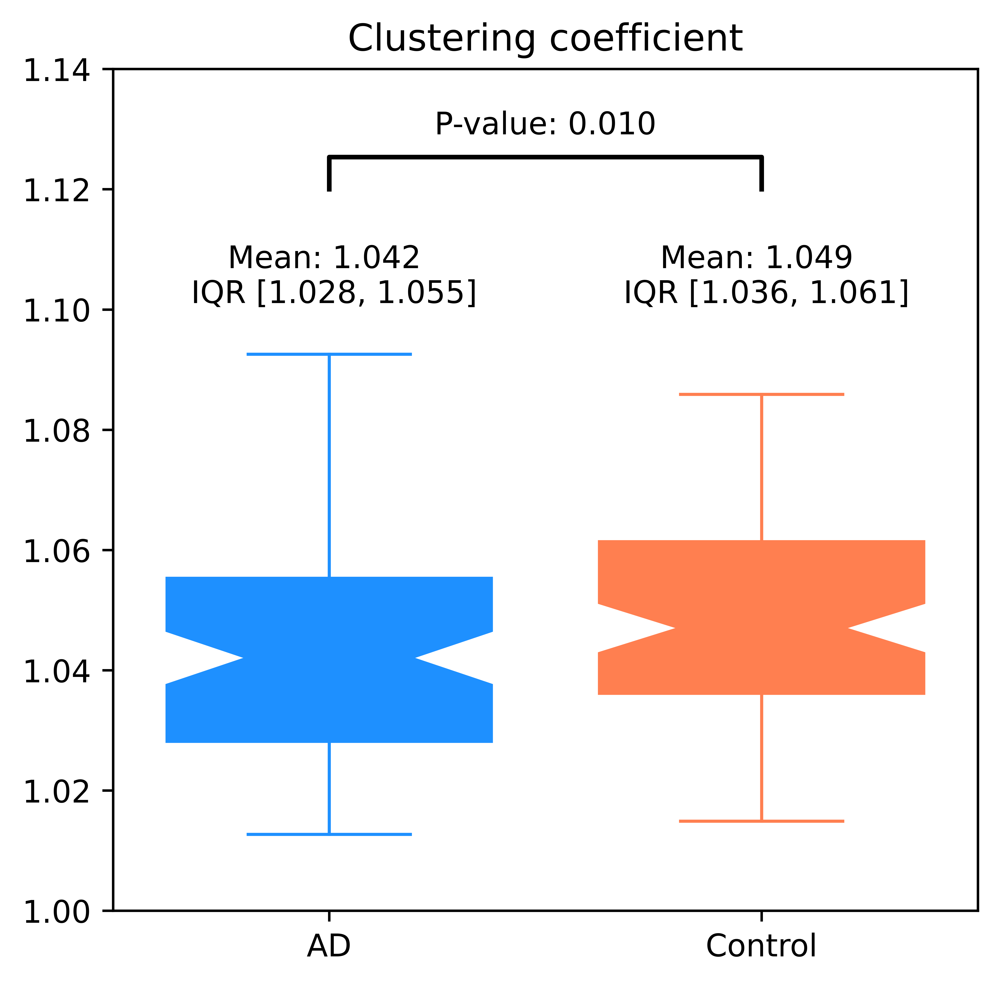

In [433]:
cur_f = "tmC"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD = [topk_mean(1, graphic_f, dwell, cur_f)
                 for graphic_f, dwell in zip(graphic_fs_AD, dwellsAD)]
cur_fs_Ctrl = [topk_mean(1, graphic_f, dwell, cur_f)
                   for graphic_f, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)]
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_plot_base(cur_fs_AD, cur_fs_Ctrl)
tmp_plot_bar(txty=1.1, bary=1.12, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
plt.ylim([1.00, 1.14])
plt.title(full_name)

plt.savefig(f"./plots/graphic_fs_top1_{full_name}.jpg", bbox_inches='tight')

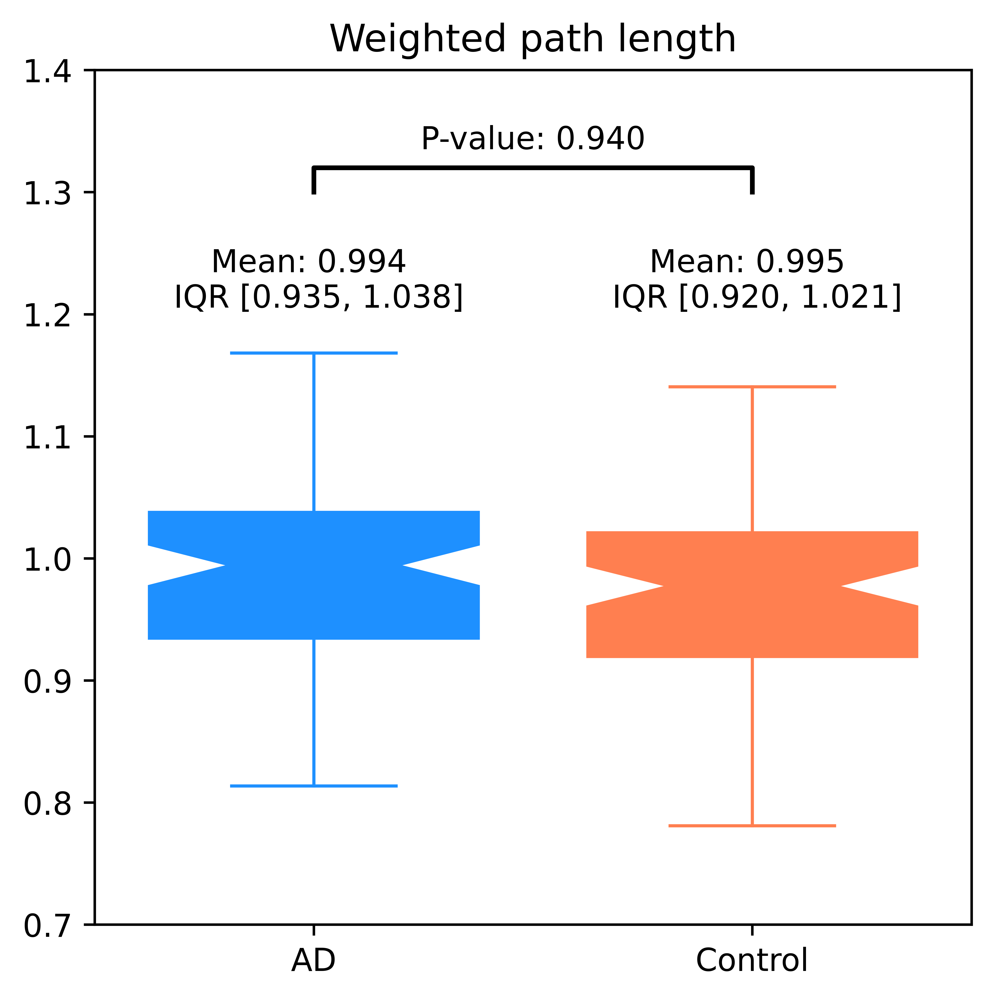

In [434]:
cur_f = "tmL"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD = [topk_mean(1, graphic_f, dwell, cur_f)
                 for graphic_f, dwell in zip(graphic_fs_AD, dwellsAD)]
cur_fs_Ctrl = [topk_mean(1, graphic_f, dwell, cur_f)
                   for graphic_f, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)]
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_plot_base(cur_fs_AD, cur_fs_Ctrl)
tmp_plot_bar(txty=1.2, bary=1.30, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
plt.ylim([0.70, 1.4])
plt.title(full_name)

plt.savefig(f"./plots/graphic_fs_top1_{full_name}.jpg", bbox_inches='tight')

### Plots of FC without top1

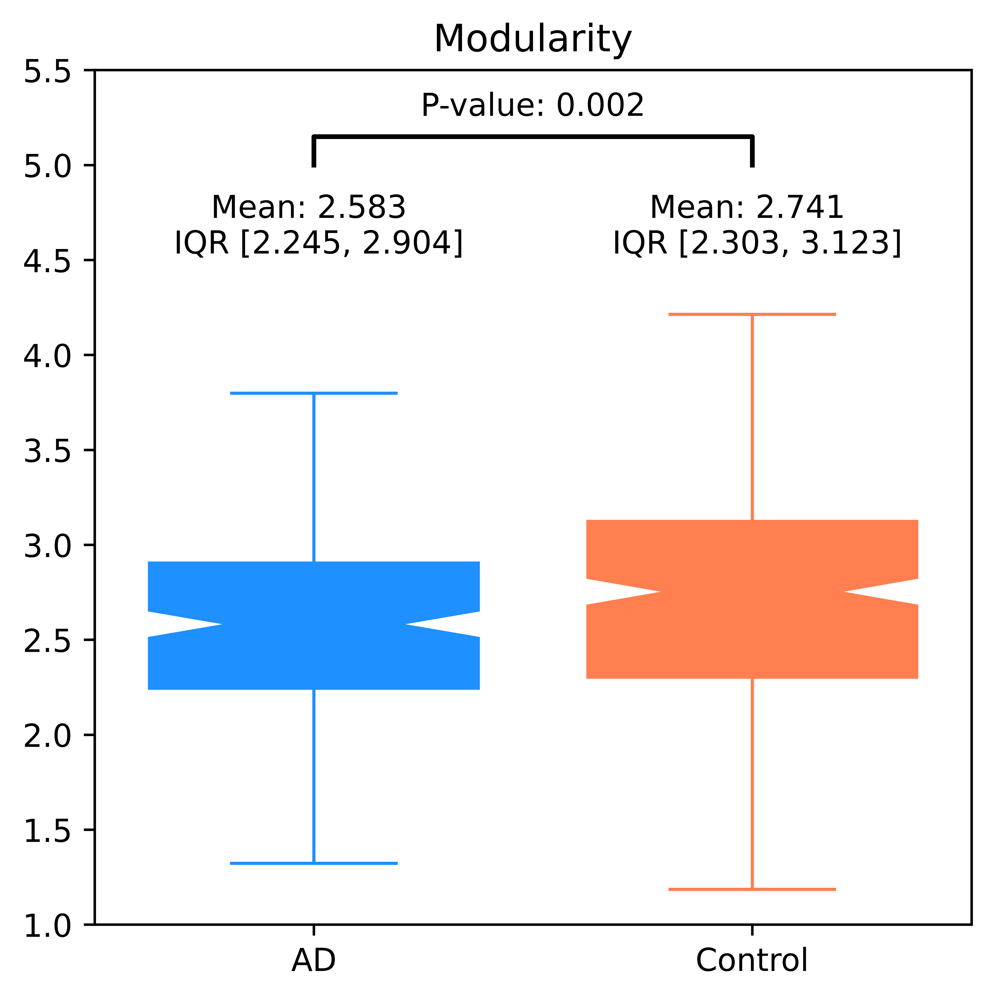

In [443]:
cur_f = "tQ"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_AD, dwellsAD)])
cur_fs_Ctrl =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_plot_base(cur_fs_AD, cur_fs_Ctrl)
tmp_plot_bar(txty=4.5, bary=5.0, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
plt.ylim([1, 5.5])
plt.title(full_name)

plt.savefig(f"./plots/graphic_fs_extop1_{full_name}.jpg", bbox_inches='tight')

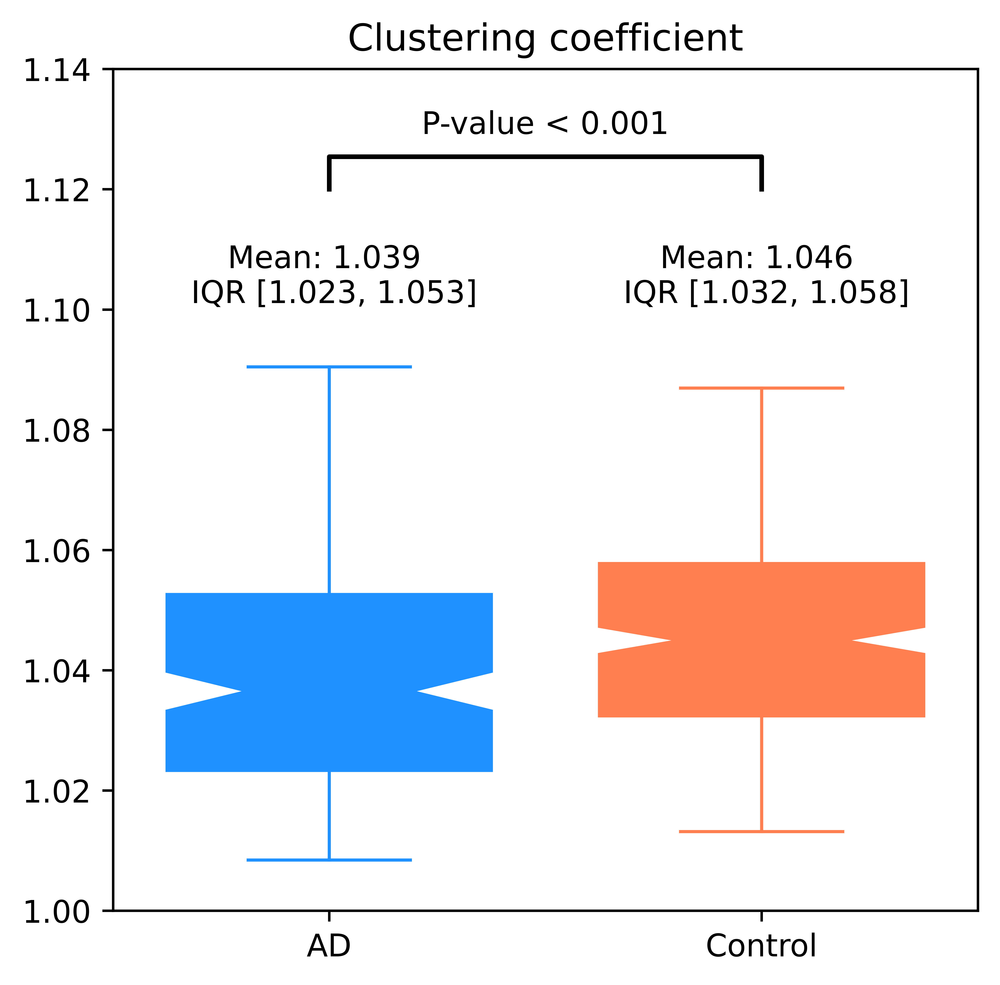

In [438]:
cur_f = "tmC"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_AD, dwellsAD)])
cur_fs_Ctrl =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_plot_base(cur_fs_AD, cur_fs_Ctrl)
tmp_plot_bar(txty=1.1, bary=1.12, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
plt.ylim([1.00, 1.14])
plt.title(full_name)

plt.savefig(f"./plots/graphic_fs_extop1_{full_name}.jpg", bbox_inches='tight')

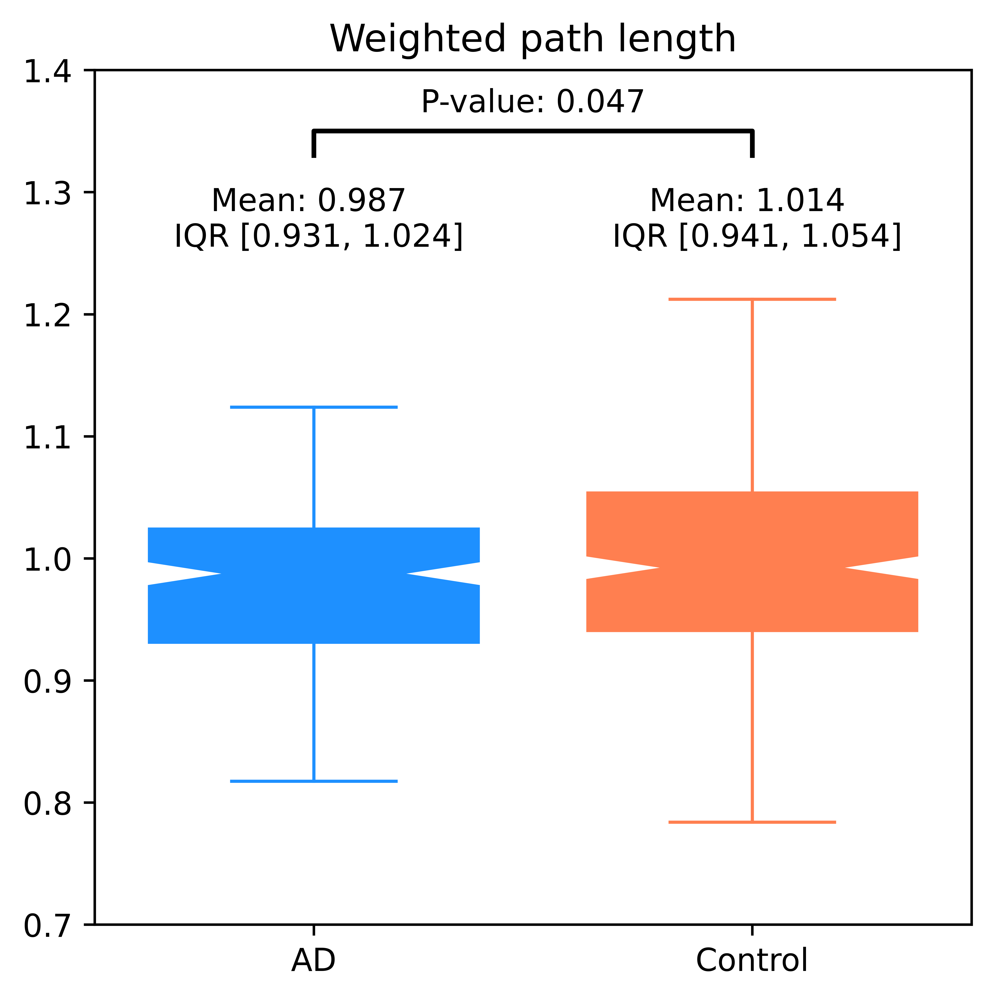

In [439]:
cur_f = "tmL"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_AD, dwellsAD)])
cur_fs_Ctrl =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_plot_base(cur_fs_AD, cur_fs_Ctrl)
tmp_plot_bar(txty=1.25, bary=1.33, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
plt.ylim([0.70, 1.4])
plt.title(full_name)

plt.savefig(f"./plots/graphic_fs_extop1_{full_name}.jpg", bbox_inches='tight')

### Var

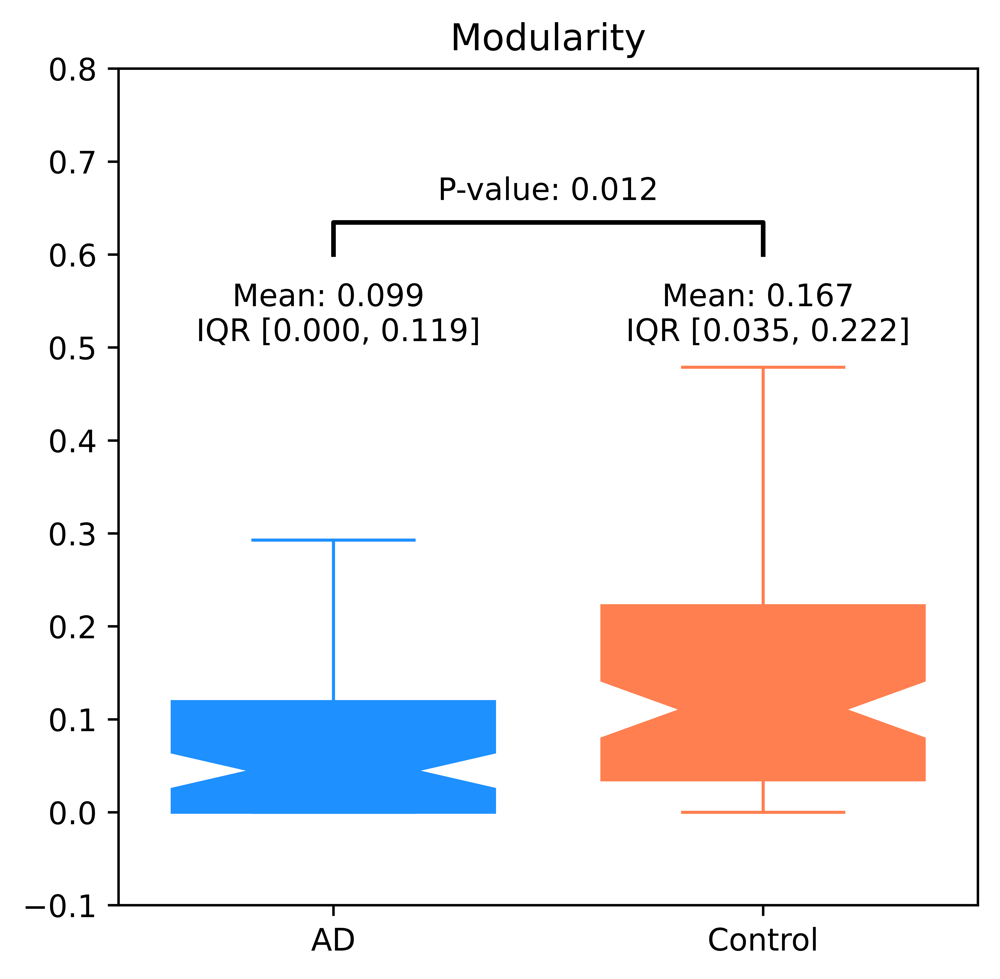

In [440]:
cur_f = "tQ"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_plot_base(cur_fs_AD, cur_fs_Ctrl)
tmp_plot_bar(txty=0.5, bary=0.6, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
plt.ylim([-0.1, 0.8])
plt.title(full_name)

plt.savefig(f"./plots/graphic_fs_var_{full_name}.jpg", bbox_inches='tight')

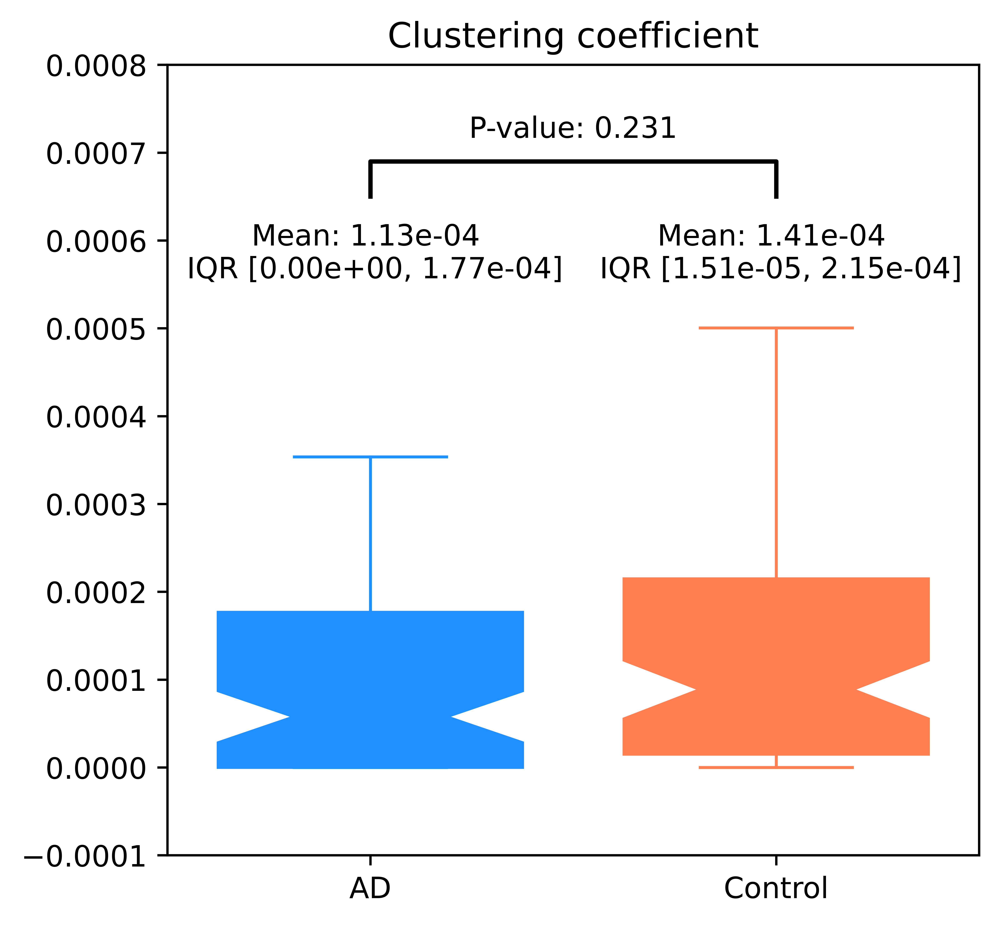

In [441]:
cur_f = "tmC"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_plot_base(cur_fs_AD, cur_fs_Ctrl)
tmp_plot_bar(txty=0.00055, bary=0.00065, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue, is_small=1)
plt.ylim([-0.0001, 0.0008])
plt.title(full_name)

plt.savefig(f"./plots/graphic_fs_var_{full_name}.jpg", bbox_inches='tight')

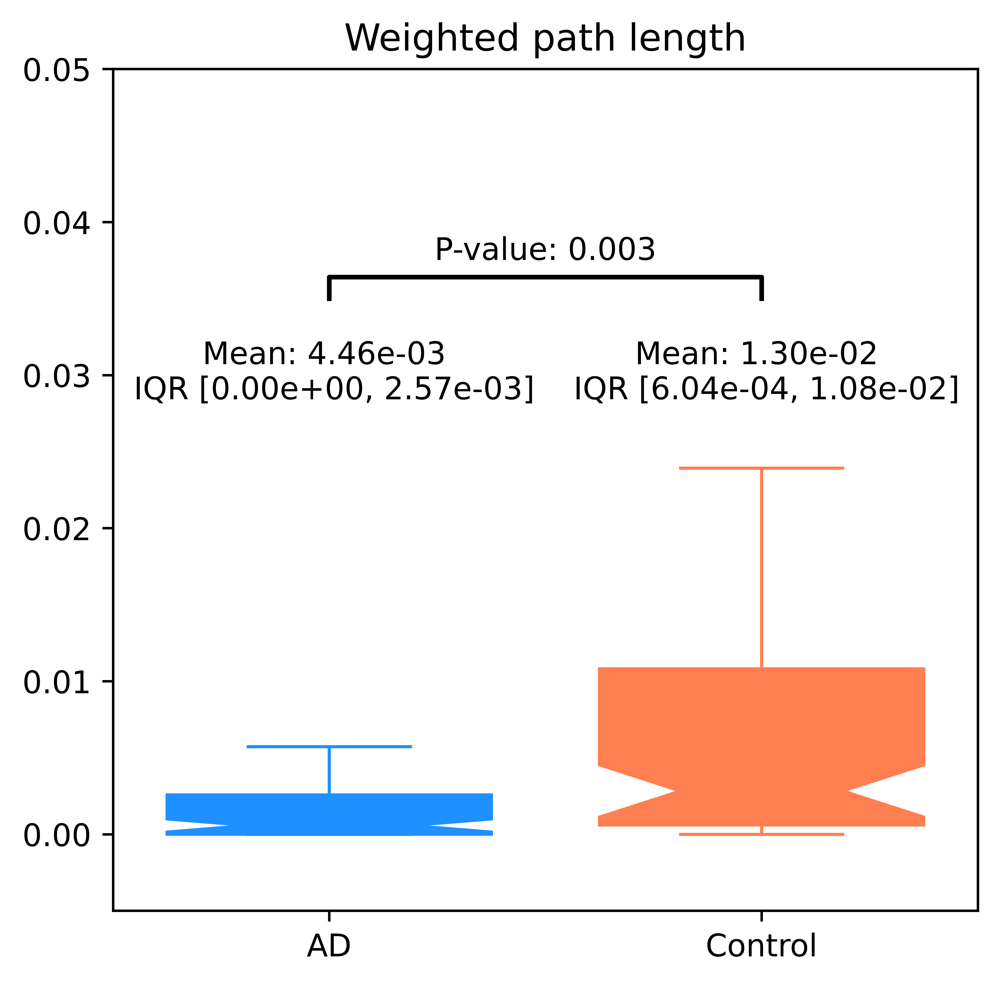

In [442]:
cur_f = "tmL"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_plot_base(cur_fs_AD, cur_fs_Ctrl)
tmp_plot_bar(txty=0.028, bary=0.035, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue, is_small=1)
plt.ylim([-0.005, 0.05])
plt.title(full_name)

plt.savefig(f"./plots/graphic_fs_var_{full_name}.jpg", bbox_inches='tight')

## Output figs (err bar)
error bar

In [207]:
def tmp_errbar_boxplot(cen_pt, err_v, x_v, col, box_len=None):
    if box_len is None:
        box_len = err_v/2
    plt.fill_between(x=[x_v-0.03, x_v+0.03], 
                     y1=[cen_pt-box_len, cen_pt-box_len], 
                     y2=[cen_pt+box_len, cen_pt+box_len],
                     color=col, alpha=1)
    plt.errorbar(x=x_v, y=cen_pt, yerr=err_v, fmt='', color=col, capsize=10, elinewidth=2, capthick=2)
    plt.plot(x_v, cen_pt, marker='h', color="black")

def tmp_errbar_boxplot_wrap(fs_AD, fs_Ctrl, cols, box_len=None):
    mean_AD, se_AD = np.mean(fs_AD), np.std(fs_AD)/np.sqrt(len(fs_AD))
    mean_Ctrl, se_Ctrl = np.mean(fs_Ctrl), np.std(fs_Ctrl)/np.sqrt(len(fs_Ctrl))
    if box_len is None:
        box_len = (se_AD+se_Ctrl)/2
    tmp_errbar_boxplot(mean_AD, 1.96*se_AD, 0.4, cols[0], box_len)
    tmp_errbar_boxplot(mean_Ctrl, 1.96*se_Ctrl, 0.6, cols[1], box_len)
    plt.xlim([0.3, 0.7])
    #plt.xticks([0.4, 0.6], ["AD", "Control"], fontsize=18)
    plt.xticks([])
    
    
def tmp_plot_bar2(fs, pvalue, ylim_fcts=[0.2, 0.5], is_small=False):
    AD_fs, Ctrl_fs = fs
    AD_CI, Ctrl_CI = CI95(AD_fs), CI95(Ctrl_fs)
    
    ylow_fct, yup_fct = ylim_fcts
    minv, maxv = np.min(AD_CI+Ctrl_CI), np.max(AD_CI+Ctrl_CI)
    vrange = maxv - minv
    if pvalue < 0.05:
        ylow, yup = minv-ylow_fct*vrange, maxv+yup_fct*vrange
    else:
        ylow, yup = minv-ylow_fct*vrange, maxv+ylow_fct*vrange
    box_len = 0.06 * (yup-ylow)

    # left txt
    #ix = 0.4
    #if is_small:
    #    txt1 = f"Mean: {np.mean(AD_fs):.2e} \n CI [{AD_CI[0]:.2e}, {AD_CI[1]:.2e}]"
    #    plt.text(ix, txty, txt1, ha='center', va='bottom', color="k", fontsize=12)
    #else:
    #    txt1 = f"Mean: {np.mean(AD_fs):.3f} \n CI [{AD_CI[0]:.3f}, {AD_CI[1]:.3f}]"
    #    plt.text(ix, txty, txt1, ha='center', va='bottom', color="k", fontsize=12)
    
    # right txt
    #ix = 0.6
    # if is_small:
    #     txt2 = f"Mean: {np.mean(Ctrl_fs):.2e} \n CI [{Ctrl_CI[0]:.2e}, {Ctrl_CI[1]:.2e}]"
    #     plt.text(ix, txty, txt2, ha='center', va='bottom', color="k", fontsize=12)
    # else:
    #     txt2 = f"Mean: {np.mean(Ctrl_fs):.3f} \n CI [{Ctrl_CI[0]:.3f}, {Ctrl_CI[1]:.3f}]"
    #     plt.text(ix, txty, txt2, ha='center', va='bottom', color="k", fontsize=12)
    
    # bar and txt above
    ix = 0.5
    txtxdlt = 0.1
    txtx1, txtx2 = ix-txtxdlt, ix+txtxdlt
    
    txth = vrange*0.05
    txth1 = vrange*0.05
    bary = yup-0.30*vrange
    if pvalue<=0.05:
        plt.plot([txtx1, txtx1, txtx2, txtx2], [bary, bary+txth, bary+txth, bary], lw=1.5, c="k")
    
    if pvalue < 0.001:
        txt1 = "P-value < 0.001"
        #txt1 = "P-value$\\bf < 0.001$"
        plt.text(ix, bary+txth+txth1, txt1, ha='center', va='bottom', color="k", fontsize=18)
    elif pvalue <=0.05:
        #txt1 = f"P-value: $\\bf {pvalue:.3f}$"
        txt1 = f"P-value:  {pvalue:.3f}"
        plt.text(ix, bary+txth+txth1, txt1, ha='center', va='bottom', color="k", fontsize=18)
    else:
        pass
        #txt1 = "ns"
        #txt1 = f"P-value: {pvalue:.3f}"
        #plt.text(ix, bary+txth+txth1, txt1, ha='center', va='bottom', color="k", fontsize=18)
    plt.ylim([ylow, yup])
    return box_len

### Plots of top1

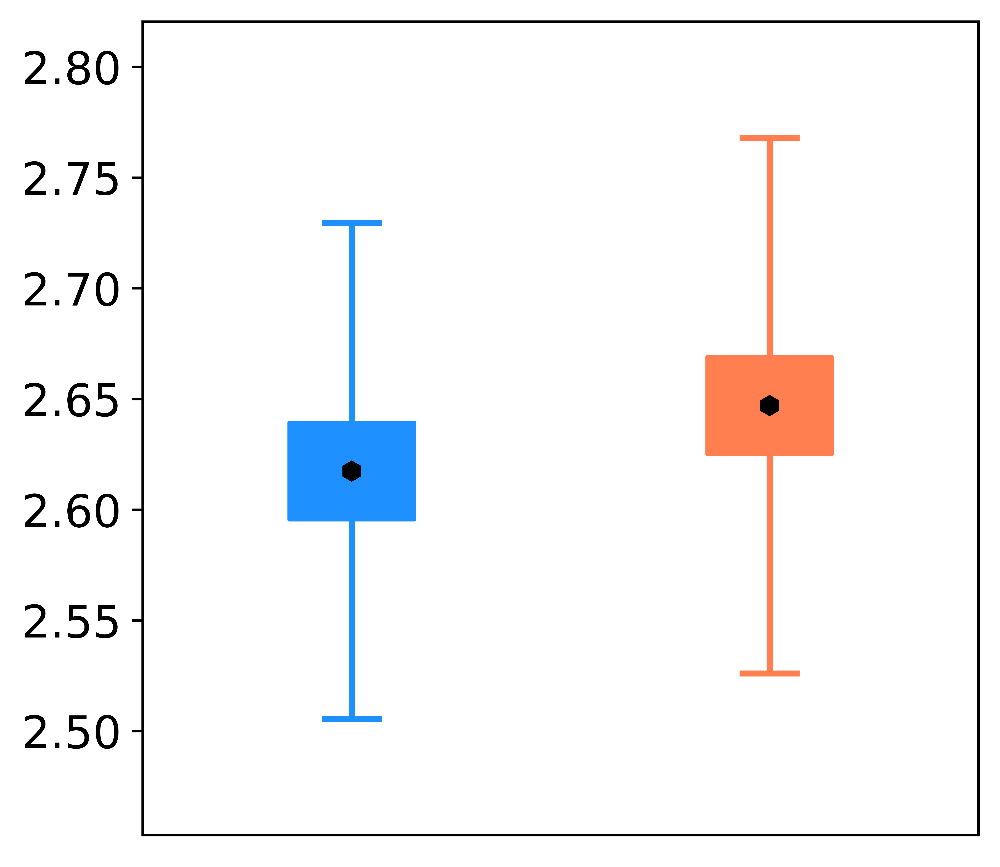

In [208]:
cur_f = "tQ"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD = [topk_mean(1, graphic_f, dwell, cur_f)
                 for graphic_f, dwell in zip(graphic_fs_AD, dwellsAD)]
cur_fs_Ctrl = [topk_mean(1, graphic_f, dwell, cur_f)
                   for graphic_f, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)]
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
plt.yticks(fontsize=15);
#plt.title(full_name, fontsize=20);

plt.savefig(f"./plots/graphic_fs_errbar_top1_{full_name}.jpg", bbox_inches='tight');

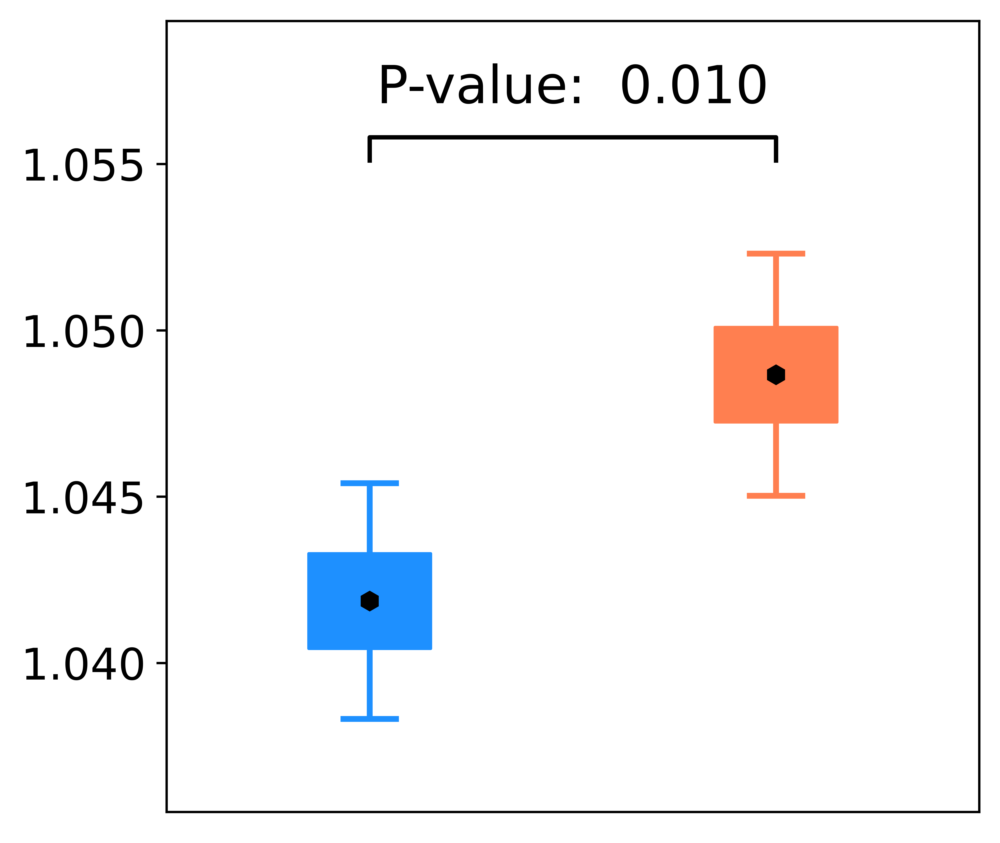

In [209]:
cur_f = "tmC"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD = [topk_mean(1, graphic_f, dwell, cur_f)
                 for graphic_f, dwell in zip(graphic_fs_AD, dwellsAD)]
cur_fs_Ctrl = [topk_mean(1, graphic_f, dwell, cur_f)
                   for graphic_f, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)]
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_top1_{full_name}.jpg", bbox_inches='tight')

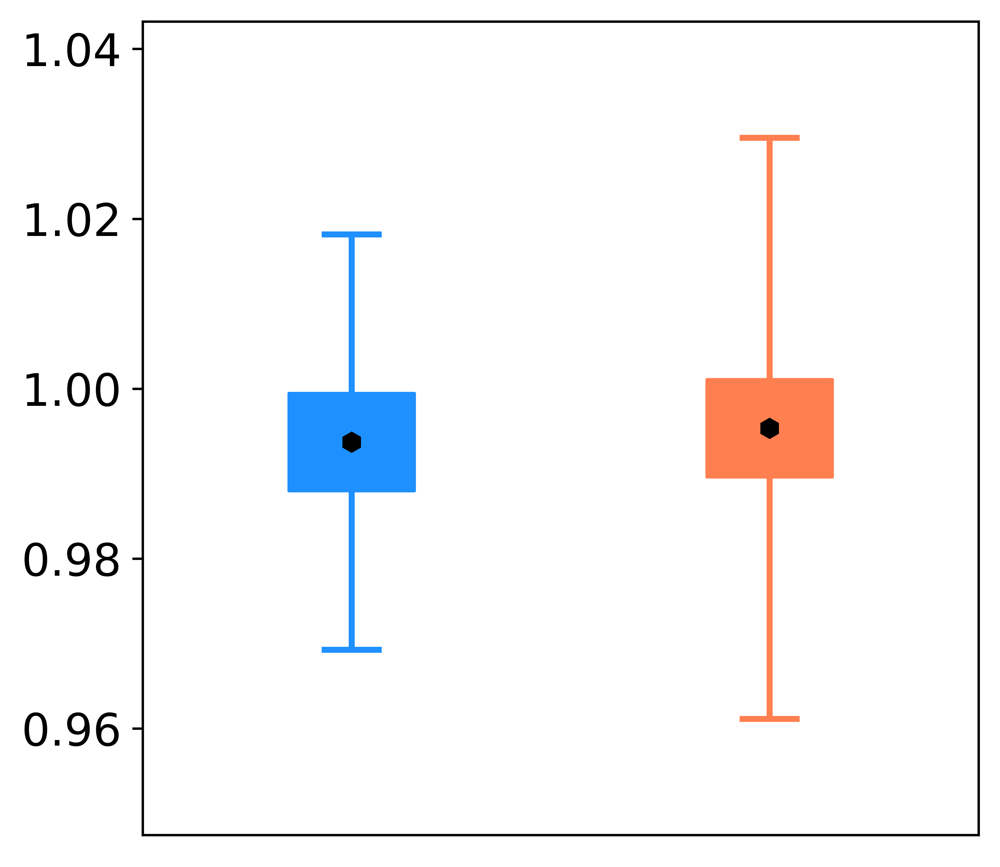

In [210]:
cur_f = "tmL"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD = [topk_mean(1, graphic_f, dwell, cur_f)
                 for graphic_f, dwell in zip(graphic_fs_AD, dwellsAD)]
cur_fs_Ctrl = [topk_mean(1, graphic_f, dwell, cur_f)
                   for graphic_f, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)]
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_top1_{full_name}.jpg", bbox_inches='tight')

### plots of excluding top1

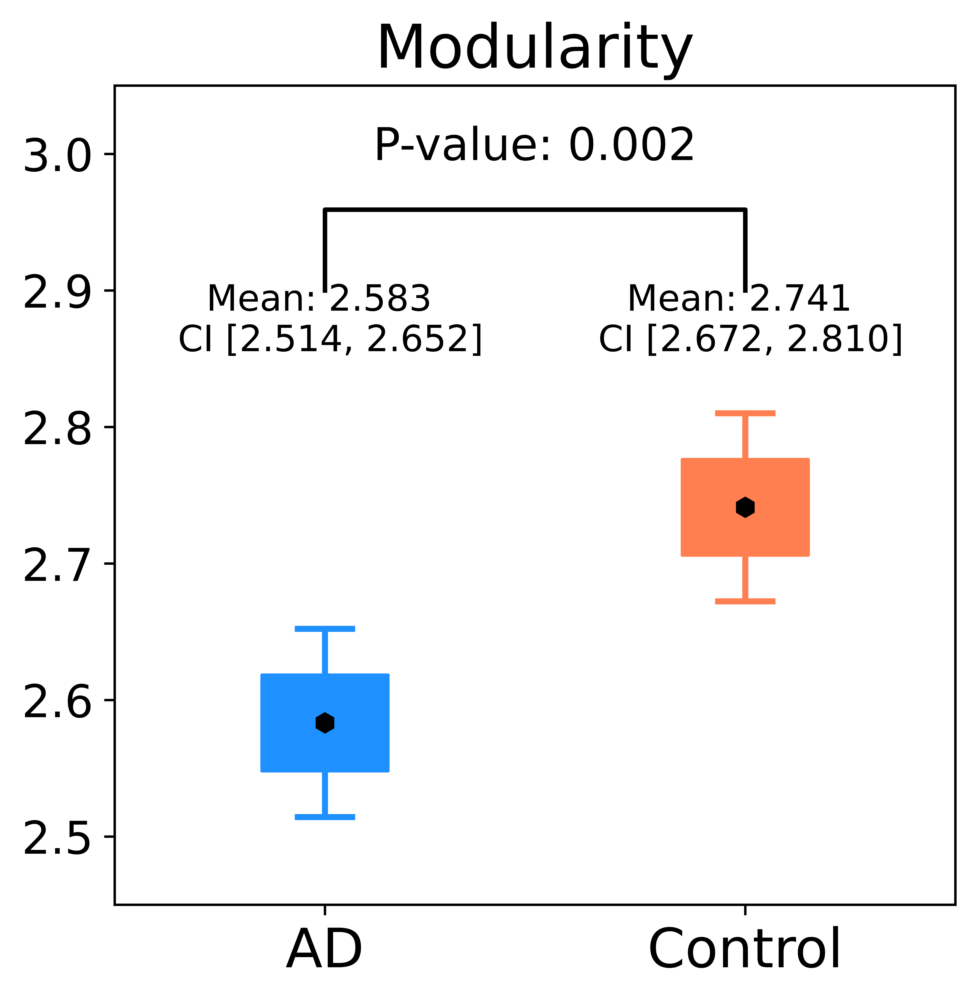

In [486]:
cur_f = "tQ"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_AD, dwellsAD)])
cur_fs_Ctrl =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)


plt.figure(figsize=[5, 5], dpi=1200)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols)
tmp_plot_bar2(txty=2.85, bary=2.9, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
plt.ylim([2.45, 3.05])
plt.yticks(fontsize=15)
plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_extop1_{full_name}.jpg", bbox_inches='tight')

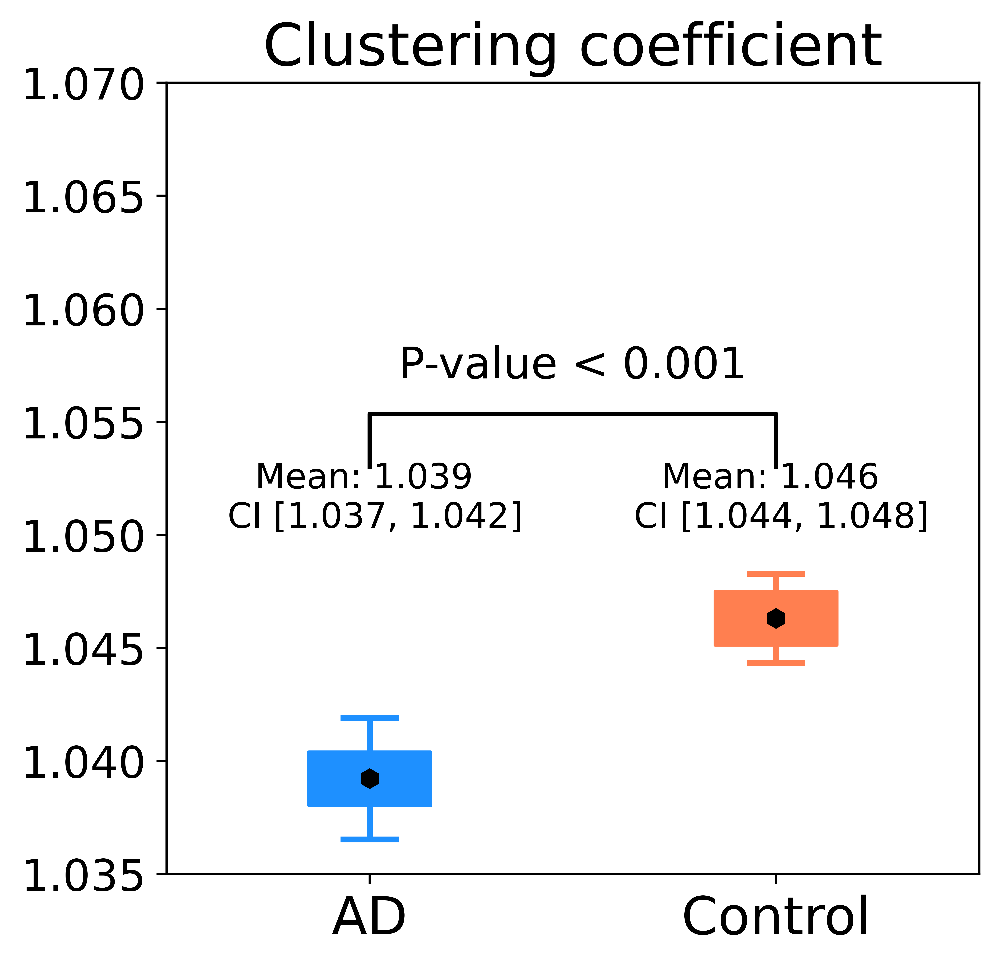

In [487]:
cur_f = "tmC"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_AD, dwellsAD)])
cur_fs_Ctrl =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols)
tmp_plot_bar2(txty=1.050, bary=1.053, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
plt.ylim([1.035, 1.07])

plt.yticks(fontsize=15)
plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_extop1_{full_name}.jpg", bbox_inches='tight')

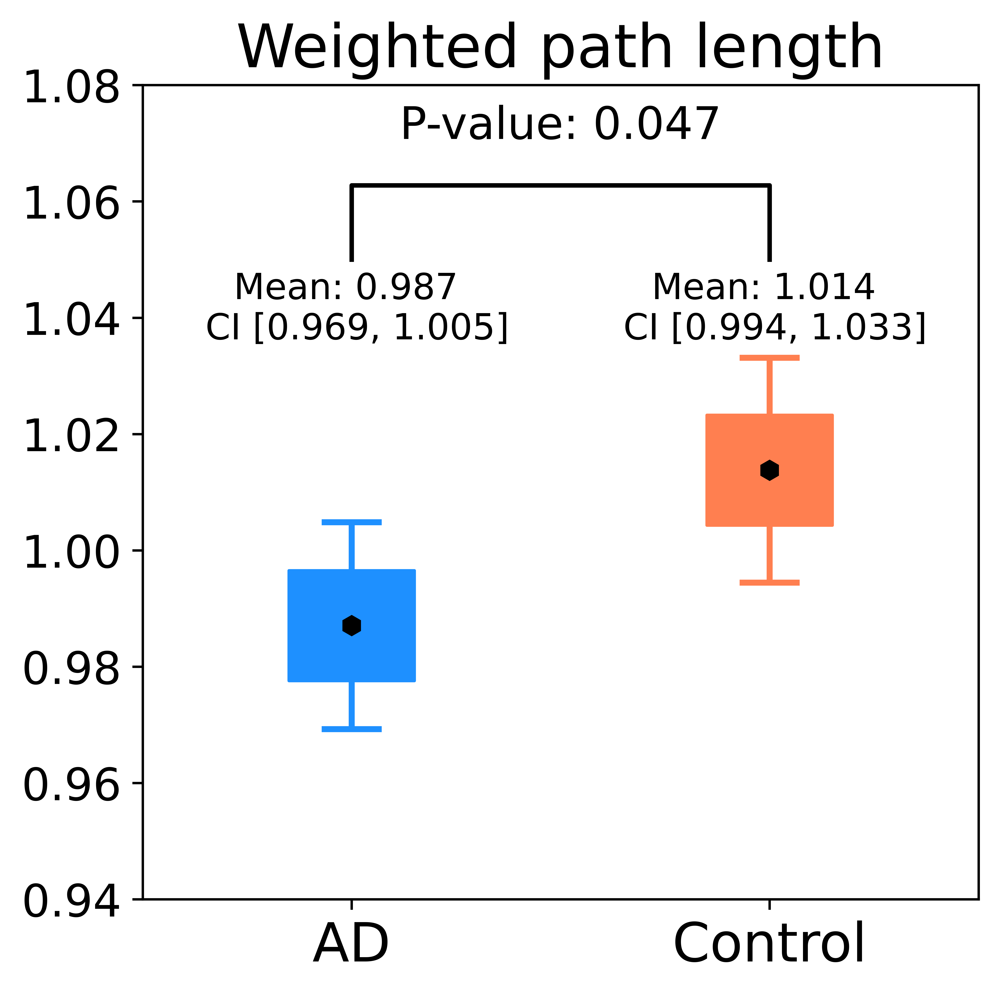

In [488]:
cur_f = "tmL"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_AD, dwellsAD)])
cur_fs_Ctrl =  np.concatenate([tmp_extract_nonmax(graphic, dwell)
                                 for graphic, dwell in zip(graphic_fs_Ctrl, dwellsCtrl)])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols)
tmp_plot_bar2(txty=1.035, bary=1.05, fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
plt.ylim([0.94, 1.08])

plt.yticks(fontsize=15)
plt.title(full_name, fontsize=20)
plt.savefig(f"./plots/graphic_fs_errbar_extop1_{full_name}.jpg", bbox_inches='tight')

### Var

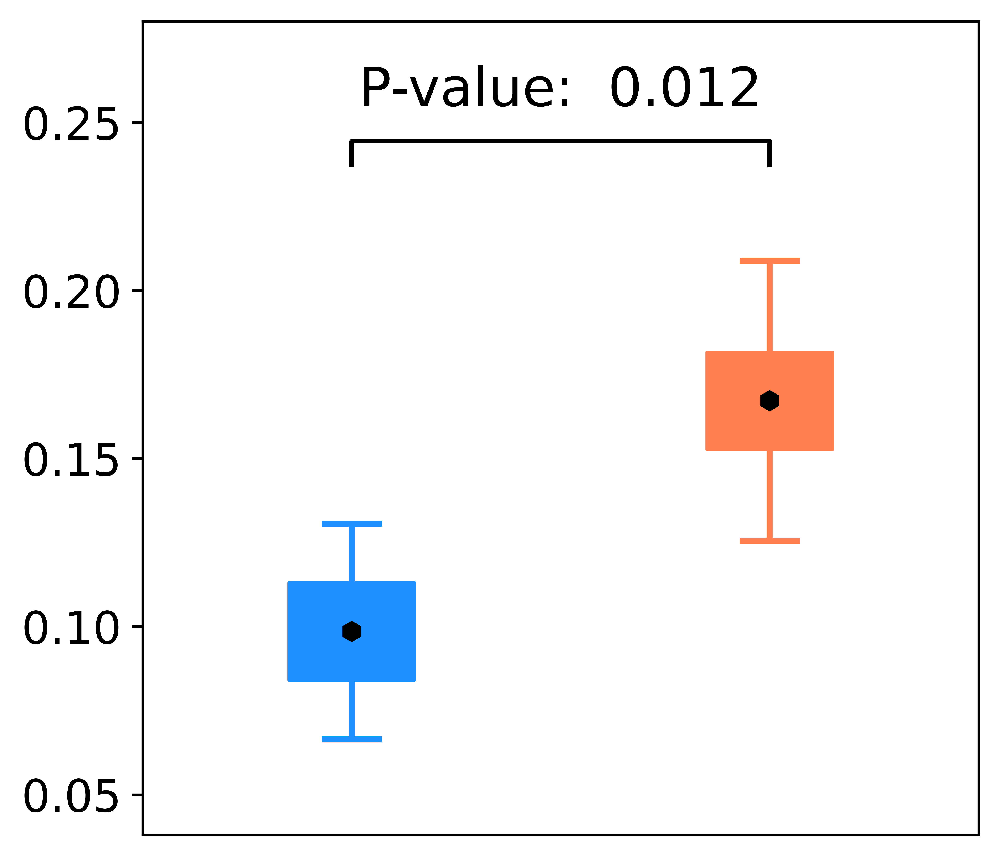

In [211]:
cur_f = "tQ"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
#plt.ylim([0, 0.35])
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_var_{full_name}.jpg", bbox_inches='tight')

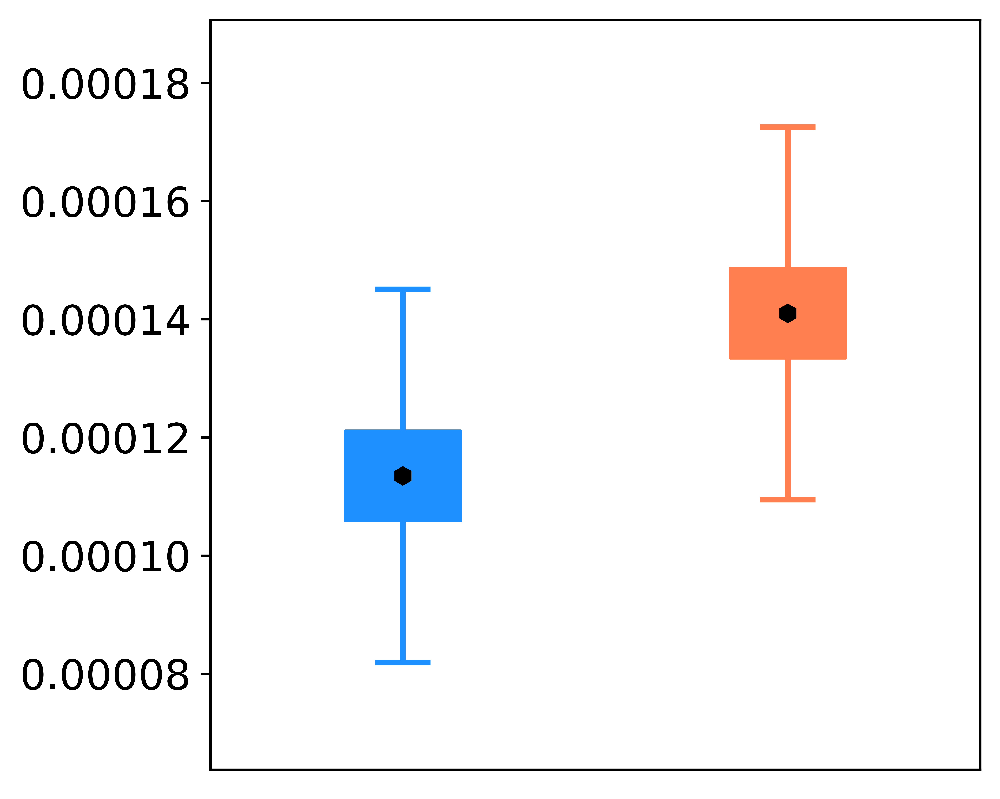

In [212]:
cur_f = "tmC"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
#plt.ylim([0.00005, 0.00020])
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_var_{full_name}.jpg", bbox_inches='tight')

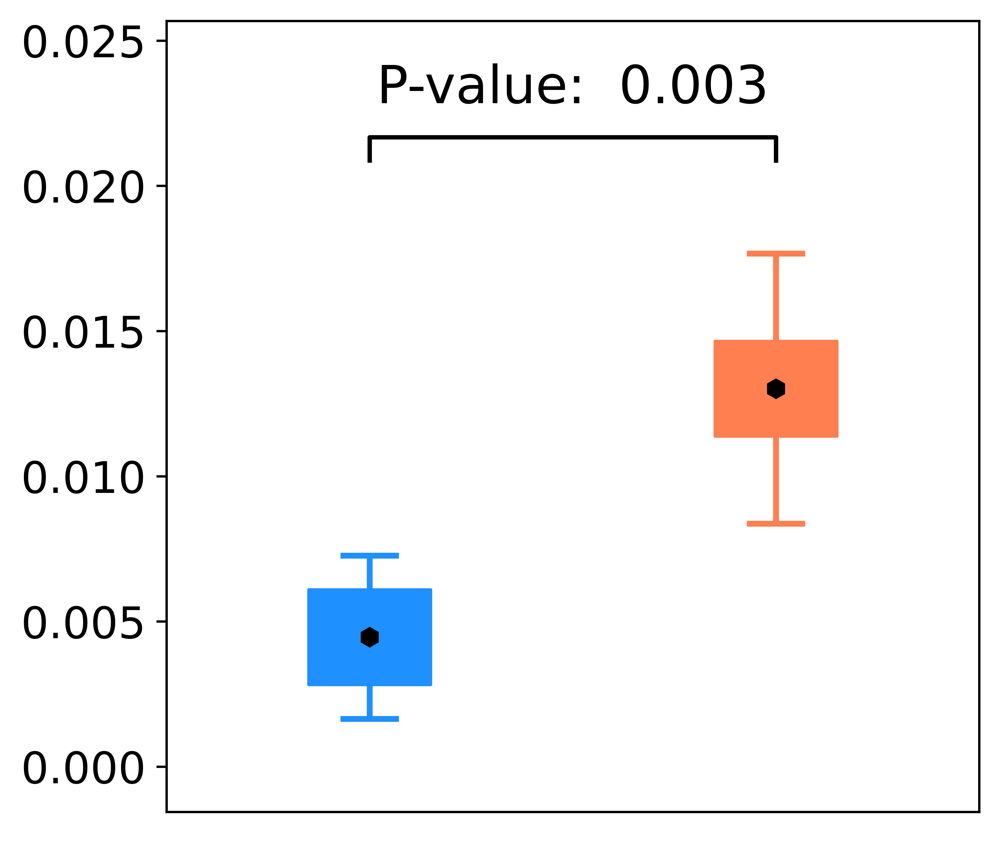

In [213]:
cur_f = "tmL"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.array([np.var([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
#plt.ylim([0.0000, 0.027])
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_var_{full_name}.jpg", bbox_inches='tight')

### Mean of each sub

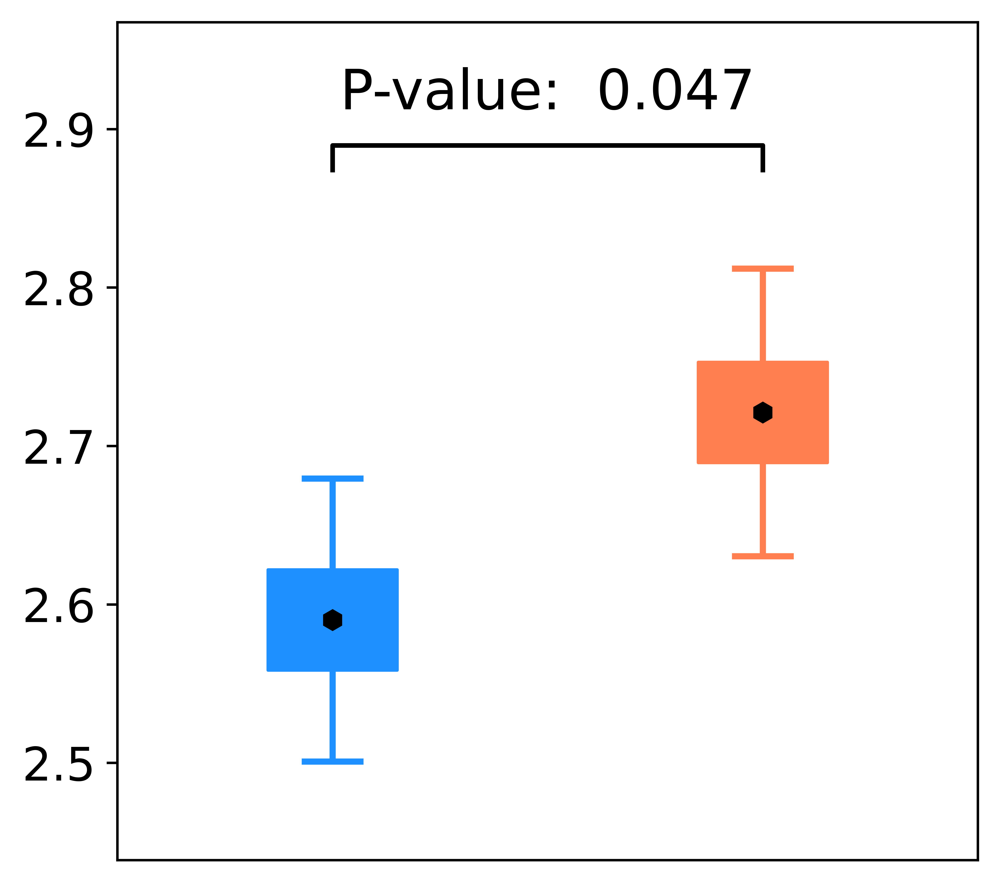

In [214]:
cur_f = "tQ"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.array([np.mean([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.array([np.mean([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
#plt.ylim([2.4, 3.10])
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_mean_{full_name}.jpg", bbox_inches='tight')

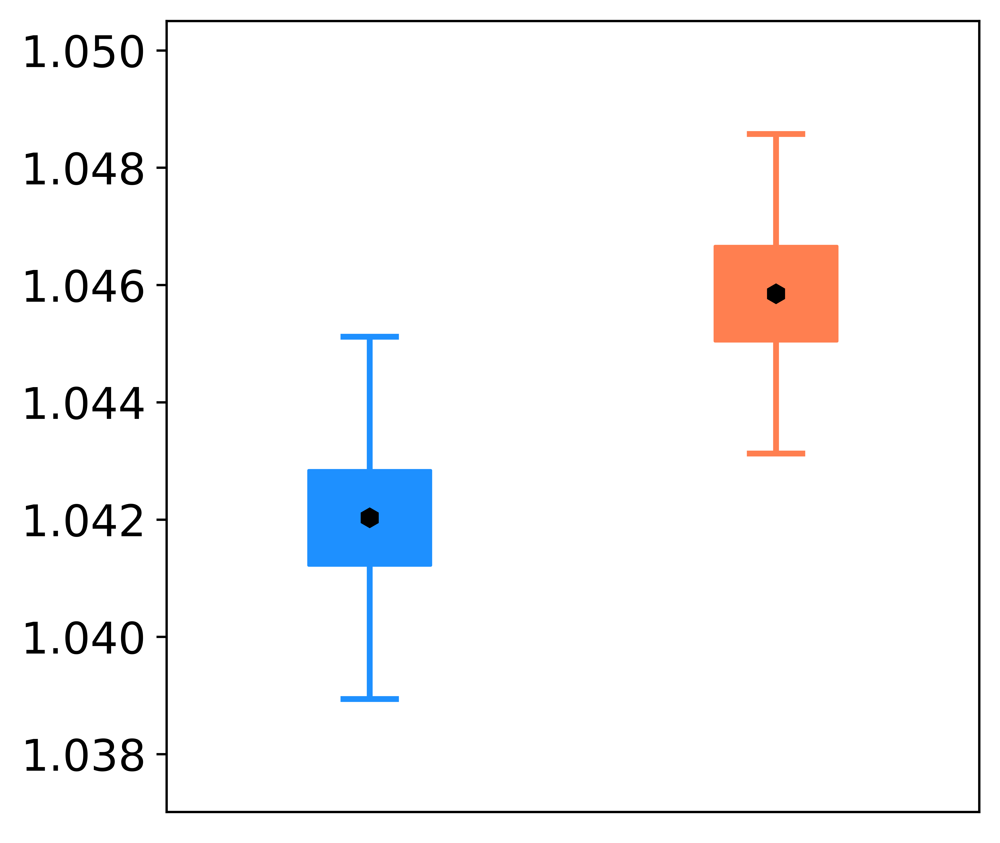

In [215]:
cur_f = "tmC"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.array([np.mean([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.array([np.mean([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
#plt.ylim([1.035, 1.050])
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_mean_{full_name}.jpg", bbox_inches='tight')

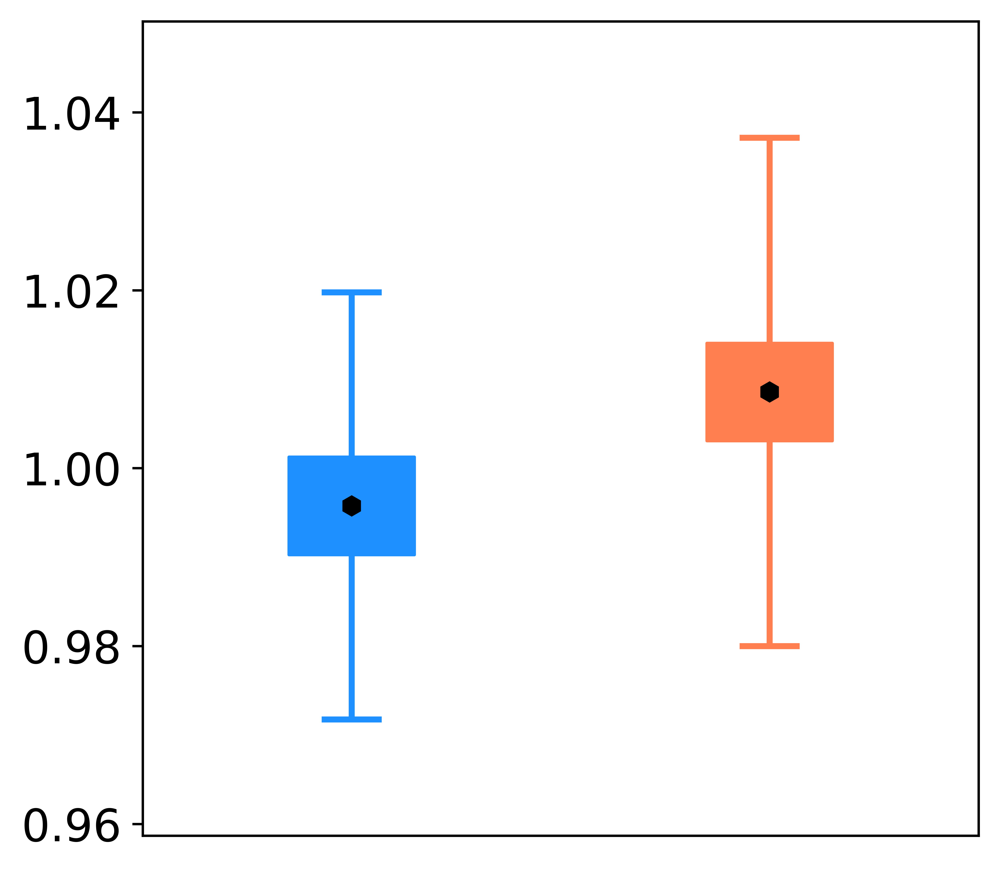

In [216]:
cur_f = "tmL"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.array([np.mean([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.array([np.mean([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
#plt.ylim([0.96, 1.04])
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_mean_{full_name}.jpg", bbox_inches='tight')

### Pool all graph metrics

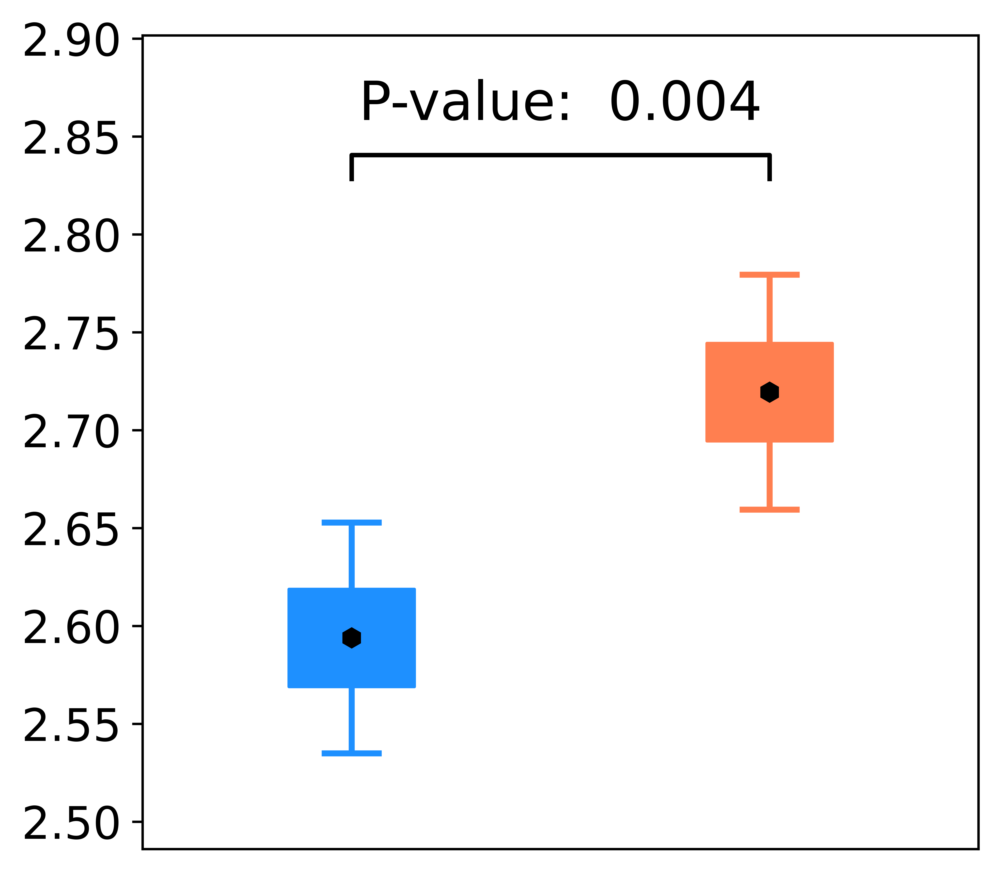

In [217]:
cur_f = "tQ"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.concatenate([np.array([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.concatenate([np.array([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)


plt.savefig(f"./plots/graphic_fs_errbar_pool_{full_name}.jpg", bbox_inches='tight')

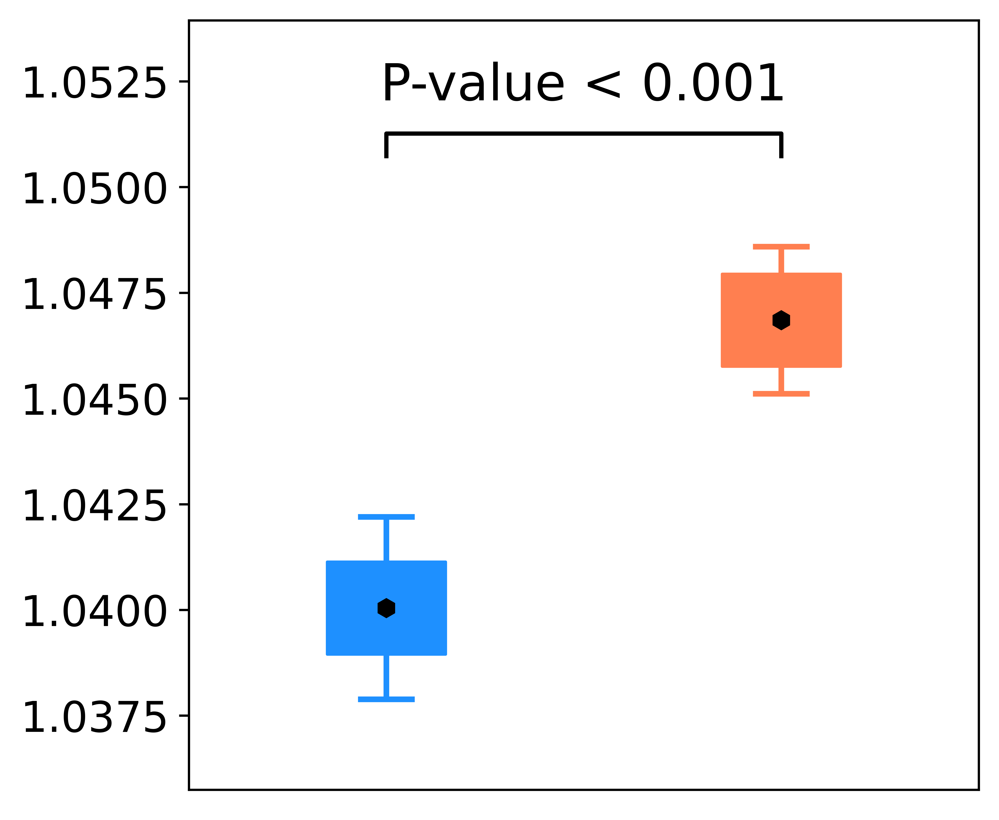

In [218]:
cur_f = "tmC"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.concatenate([np.array([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.concatenate([np.array([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)


plt.savefig(f"./plots/graphic_fs_errbar_pool_{full_name}.jpg", bbox_inches='tight')

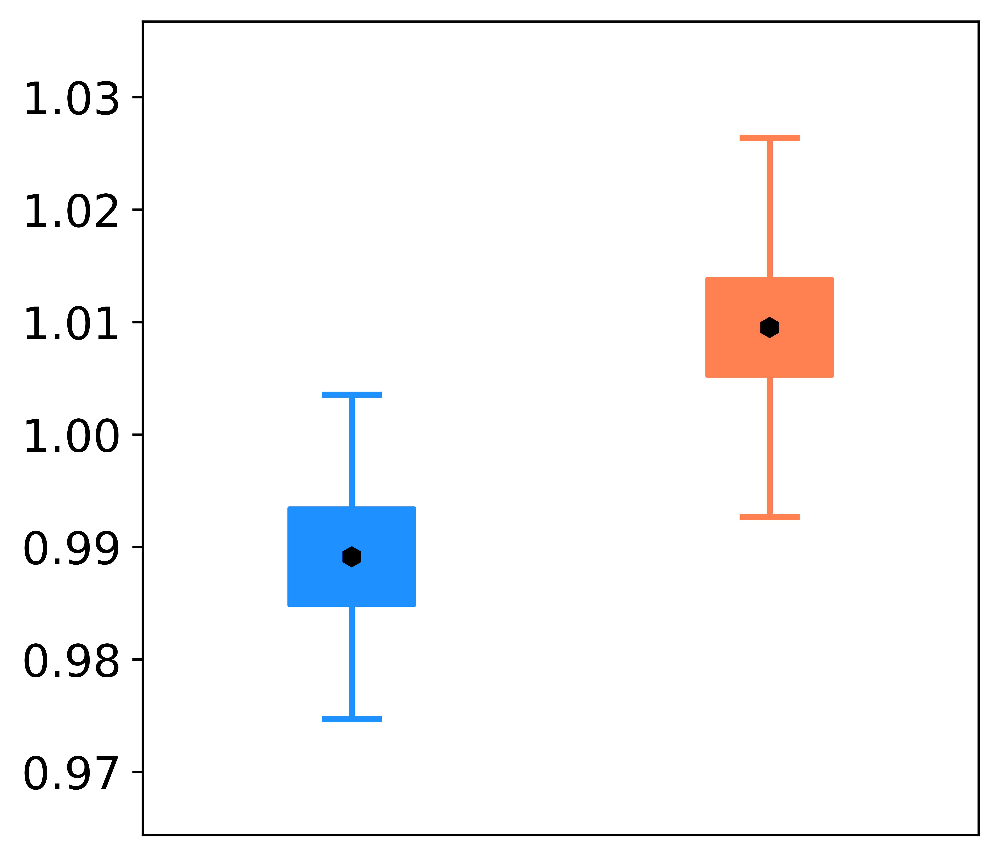

In [219]:
cur_f = "tmL"
full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD =  np.concatenate([np.array([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_AD])
cur_fs_Ctrl =  np.concatenate([np.array([iy[cur_f] for iy in ix ])
                                 for ix in graphic_fs_Ctrl])
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)


plt.savefig(f"./plots/graphic_fs_errbar_pool_{full_name}.jpg", bbox_inches='tight')

### ND plotting

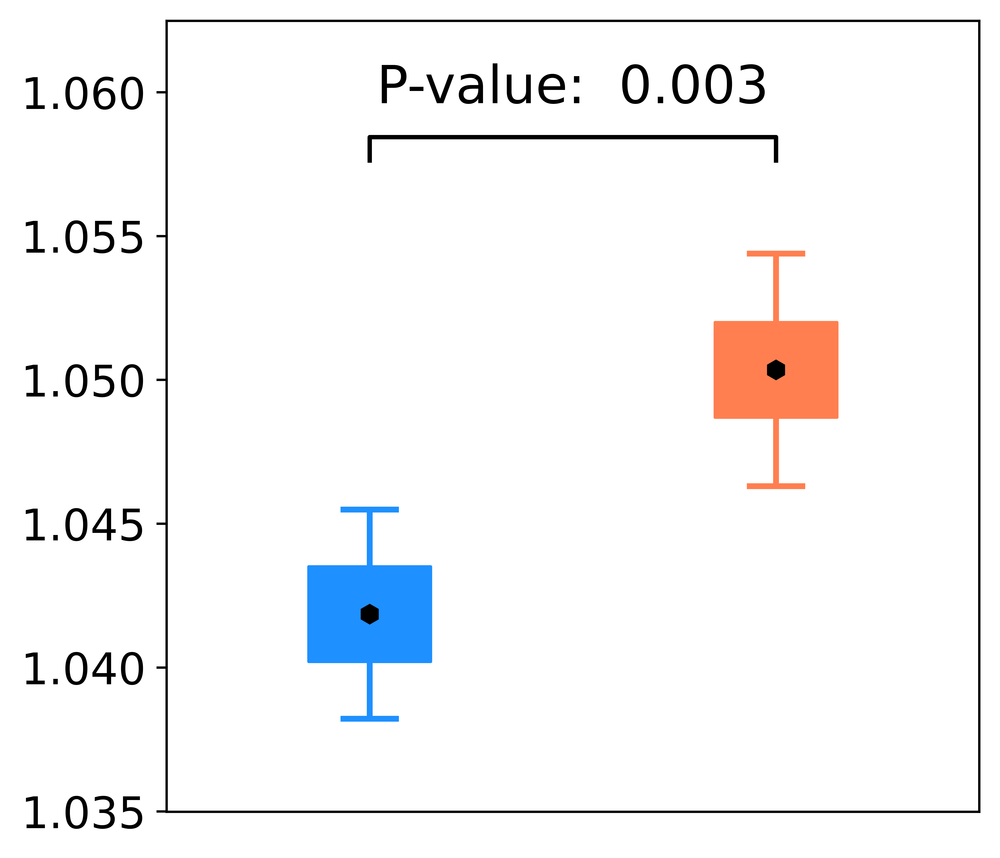

In [220]:
cur_f = "tmC"

full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD = tmp_extrac1(TV_graphic_fs_AD, cur_f)
cur_fs_Ctrl = tmp_extrac1(TV_graphic_fs_Ctrl, cur_f)
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)

plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_{full_name}_ND.jpg", bbox_inches='tight')

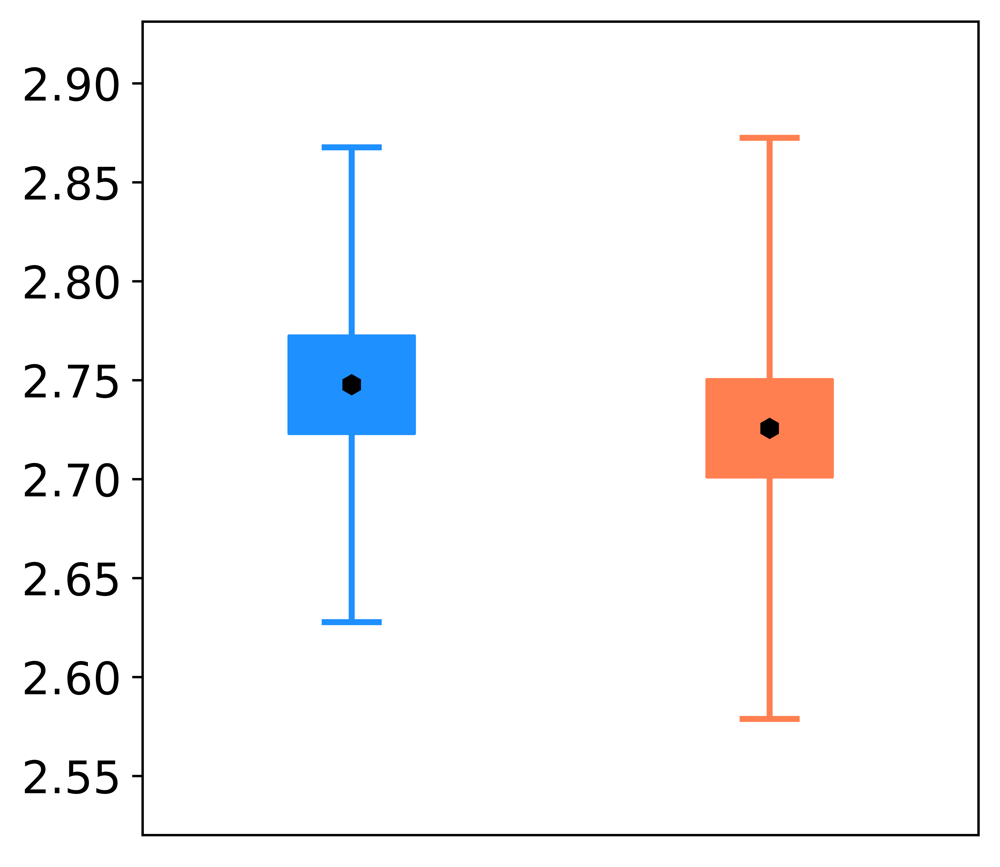

In [221]:
cur_f = "tQ"

full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD = tmp_extrac1(TV_graphic_fs_AD, cur_f)
cur_fs_Ctrl = tmp_extrac1(TV_graphic_fs_Ctrl, cur_f)
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)
plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_{full_name}_ND.jpg", bbox_inches='tight')

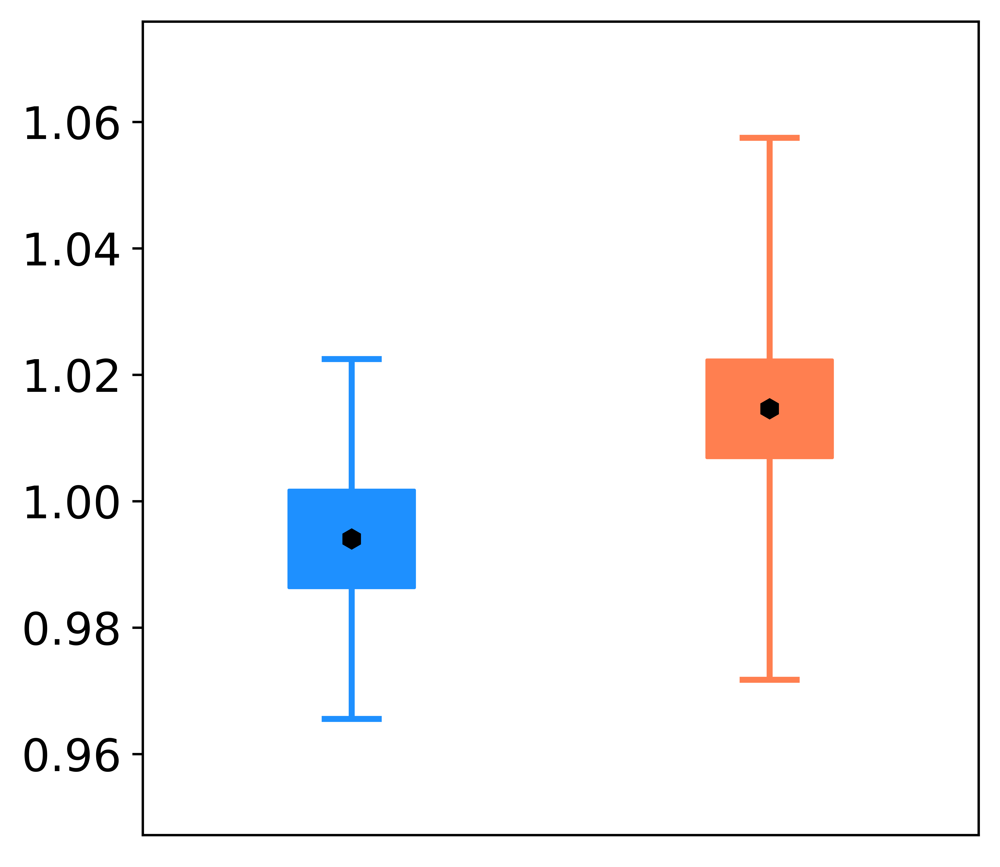

In [222]:
cur_f = "tmL"

full_name = fs_name[fs_name_raw.index(cur_f)]
cur_fs_AD = tmp_extrac1(TV_graphic_fs_AD, cur_f)
cur_fs_Ctrl = tmp_extrac1(TV_graphic_fs_Ctrl, cur_f)
test_res = scipy.stats.ttest_ind(cur_fs_AD, cur_fs_Ctrl, equal_var=False)

plt.figure(figsize=[5, 5], dpi=1200)
box_len = tmp_plot_bar2(fs=[cur_fs_AD, cur_fs_Ctrl], pvalue=test_res.pvalue)
tmp_errbar_boxplot_wrap(cur_fs_AD, cur_fs_Ctrl, cols, box_len)

plt.yticks(fontsize=15)
#plt.title(full_name, fontsize=20)

plt.savefig(f"./plots/graphic_fs_errbar_{full_name}_ND.jpg", bbox_inches='tight')

## Save some data for analysis

In [106]:
all_save_dat = {}
for cur_f in ["tQ", "tmC", "tmL"]:
    cur_fs_AD =  np.array([np.mean([iy[cur_f] for iy in ix ])
                                     for ix in graphic_fs_AD])
    cur_fs_Ctrl =  np.array([np.mean([iy[cur_f] for iy in ix ])
                                     for ix in graphic_fs_Ctrl])
    cur_fs = np.concatenate([cur_fs_AD, cur_fs_Ctrl])
    all_save_dat[cur_f] = cur_fs
    
for cur_f in ["tQ", "tmC", "tmL"]:
    cur_fs_AD = tmp_extrac1(TV_graphic_fs_AD, cur_f)
    cur_fs_Ctrl = tmp_extrac1(TV_graphic_fs_Ctrl, cur_f)
    cur_fs = np.concatenate([cur_fs_AD, cur_fs_Ctrl])
    all_save_dat[cur_f+"_ND"] = cur_fs

In [108]:
add_data = pd.DataFrame(all_save_dat)
add_data.to_csv(resDir/"TVDN_full_data_add.csv", index=False)